In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
import warnings
warnings.simplefilter("ignore")
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [2]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')
print("size of training dataset:" + str(train_df.shape))
print("size of testing dataset:" + str(test_df.shape))

size of training dataset:(442905, 434)
size of testing dataset:(147635, 433)


In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
train_df.head(10)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3424175,0,11053717,49.000,W,5033,269.0,150.0,mastercard,224.0,debit,330.0,87.0,6.0,NaN,gmail.com,NaN,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,21.0,2.0,14.0,14.0,9.0,370.0,9.0,NaN,NaN,NaN,NaN,14.0,351.0,NaN,NaN,NaN,375.0,T,T,T,M0,T,F,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,98.000000,0.000000,0.0,98.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,2.0,0.0,2.0,0.0,0.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,98.000000,0.000000,0.0,98.000000,0.0,0.000000,49.000000,98.000000,98.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3206179,0,5150

In [5]:
test_df.head(10)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3460689,12245831,325.000,W,12932,361.0,150.0,visa,226.0,debit,126.0,87.0,24.0,NaN,gmail.com,NaN,3.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,166.0,0.0,NaN,NaN,NaN,166.0,T,T,T,M0,T,T,F,F,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,325.0,325.0,325.0,0.0,0.0,0.0,325.0,325.0,325.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,325.0,325.0,325.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,325.0,325.0,325.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3415050,10807203,37.257,C,14276,177.0,185.0,mastercard,137.0,credit,NaN,NaN,NaN,NaN,gmail.com,gmail.co

In [6]:
nan1 = train_df.isna().sum()

In [7]:
nans = []
for a,b in nan1.items():
    if(b<10000):
        nans.append(a)
len(nans)

112

There are **112 columns** which have less than **10000 NaN values**. We will collect the names of these columns and drop the corresponding rows where these column values are NaN. We can afford to do this as the given training data set is huge.

In [8]:
train_df = train_df.dropna(subset=nans)

In [9]:
train_df.shape

(433584, 434)

In [10]:
y_train = train_df.iloc[:,1]
train_df = train_df.drop(['isFraud'], axis = 1)

In [11]:
bignans = []
bignans = train_df.columns[train_df.isnull().mean() > 0.90]

In [12]:
len(bignans)        

12

There are **12 columns** which have **90 percent** of the values as NaN values, so we will better drop these columns.

In [13]:
y_train.value_counts()

0    418577
1     15007
Name: isFraud, dtype: int64

In [14]:
print("Percentage of a transaction not being fraudulent: " + str((427408/(427408 + 15497))*100) + "%")
print("Percentage of a transaction being fraudulent: " + str((15497/(427408 + 15497))*100) + "%")

Percentage of a transaction not being fraudulent: 96.50105553109583%
Percentage of a transaction being fraudulent: 3.4989444689041664%


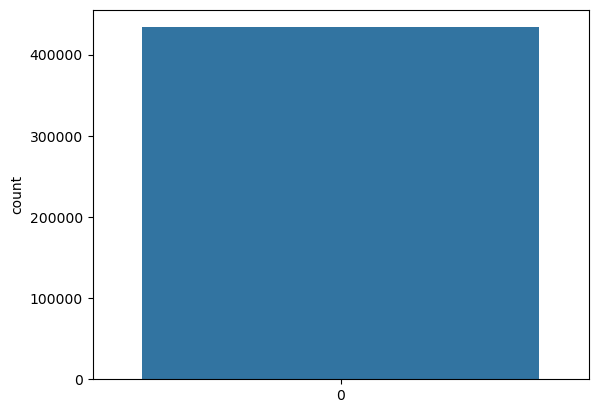

In [15]:
sns.countplot(y_train)
plt.show()

In [16]:
over = RandomOverSampler(sampling_strategy=0.5)
under = RandomUnderSampler(sampling_strategy=0.8)
# first performing oversampling to minority class
X_over, y_over = over.fit_resample(train_df, y_train)
# # now to comine under sampling 


In [17]:
x_under, y_under = under.fit_resample(X_over, y_over)

In [18]:
x_under.shape

(470898, 433)

In [19]:
y_train = y_under
train_df = x_under

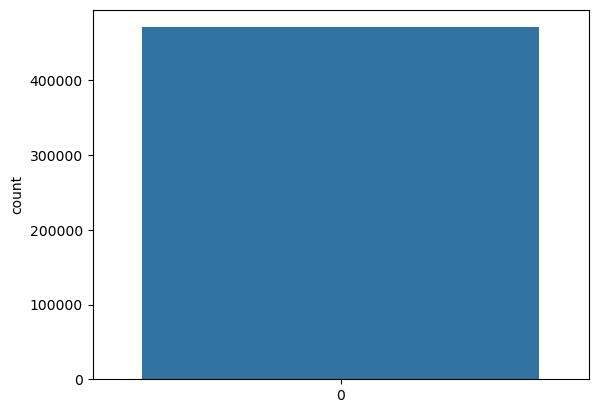

In [20]:
sns.countplot(y_train)
plt.show()

In [21]:
train_df.shape

(470898, 433)

In [22]:
df = train_df.append(test_df)

In [23]:
df = df[df.columns[df.isnull().mean() < 0.90]]

In [24]:
df.shape

(618533, 424)

In [25]:
df.head(10)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3210335,5263531,49.000,W,8785,555.0,150.0,visa,226.0,debit,436.0,87.0,2.0,NaN,yahoo.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,532.0,433.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,F,M0,T,F,F,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3100075,2211200,75.000,H,9112,250.0,150.0,visa,226.0,debit,441.0,87.0,NaN,NaN,aol.com,aol.com,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,186.583328,0.583333,NaN,NaN

In [26]:
df.isna().sum()

TransactionID          0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2               2229
card3                384
card4                386
card5               1084
card6                386
addr1             121049
addr2             121049
dist1             403919
dist2             555659
P_emaildomain      94479
R_emaildomain     412306
C1                     0
C2                     0
C3                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                   334
D2                322775
D3                292920
D4                179905
D5                314603
D6                492314
D7                534327
D8                487578
D9                487578
D10                92289


In [27]:
cards = df[['card1','card2','card3','card4','card5','card6']]
cards.head(10)

,card1,card2,card3,card4,card5,card6
0,8785,555.0,150.0,visa,226.0,debit
1,9112,250.0,150.0,visa,226.0,debit
2,1893,514.0,150.0,mastercard,224.0,credit
3,9480,170.0,150.0,visa,226.0,debit
4,2039,562.0,150.0,mastercard,219.0,credit
5,9026,545.0,185.0,visa,137.0,credit
6,10616,583.0,150.0,visa,226.0,credit
7,16659,170.0,150.0,visa,226.0,credit
8,7207,111.0,150.0,visa,226.0,debit
9,2561,174.0,150.0,visa,195.0,debit


In [28]:
cards.isna().sum()

card1       0
card2    2229
card3     384
card4     386
card5    1084
card6     386
dtype: int64

In [29]:
df['card6'].fillna(df['card6'].mode()[0], inplace = True )
df['card4'].fillna(df['card4'].mode()[0], inplace = True )

In [30]:
my_imputer = SimpleImputer()
# my_imputer = KNNImputer(n_neighbors=1)

df[['card1', 'card2', 'card3','card5']] = my_imputer.fit_transform(df[['card1', 'card2', 'card3','card5']])

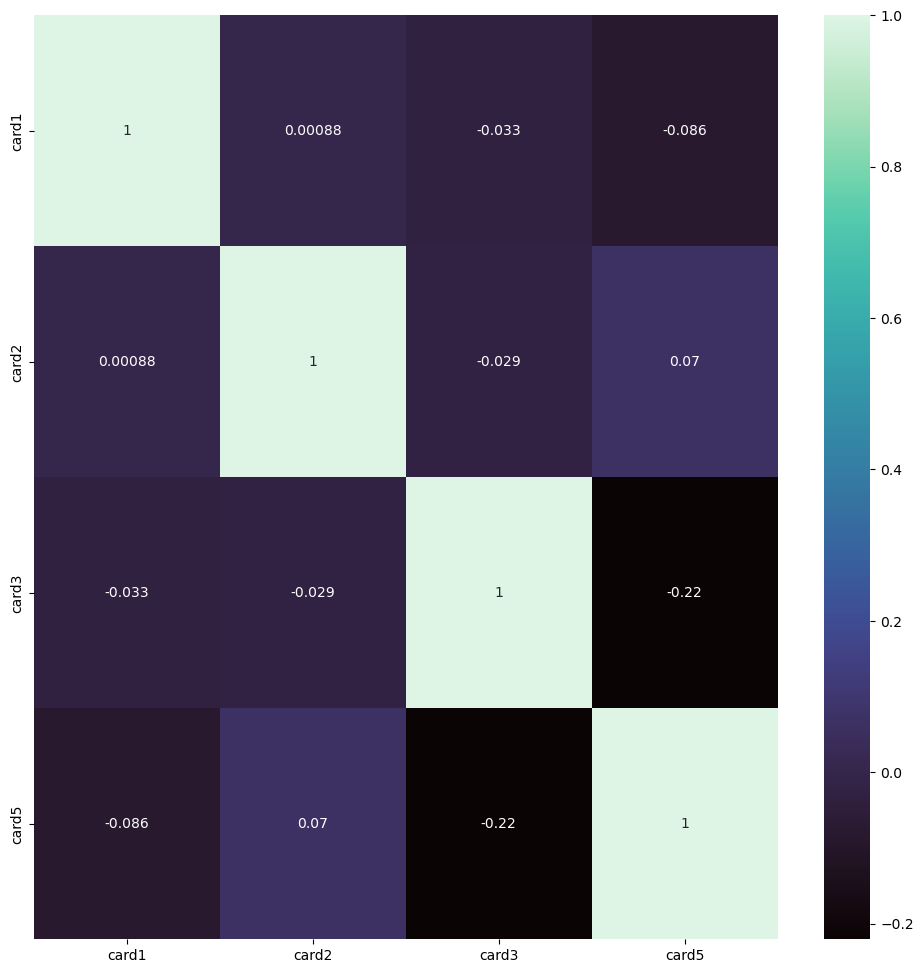

In [31]:
corr = cards.corr()
plt.figure(figsize = (12,12))
ax = sns.heatmap(corr, annot = True, cmap = 'mako')

As we can clearly see,there is no correlation between any of the columns so we cannot drop any of the columns, and card4 and card6 columns have categorical values, therefore did not show up in the heatmap

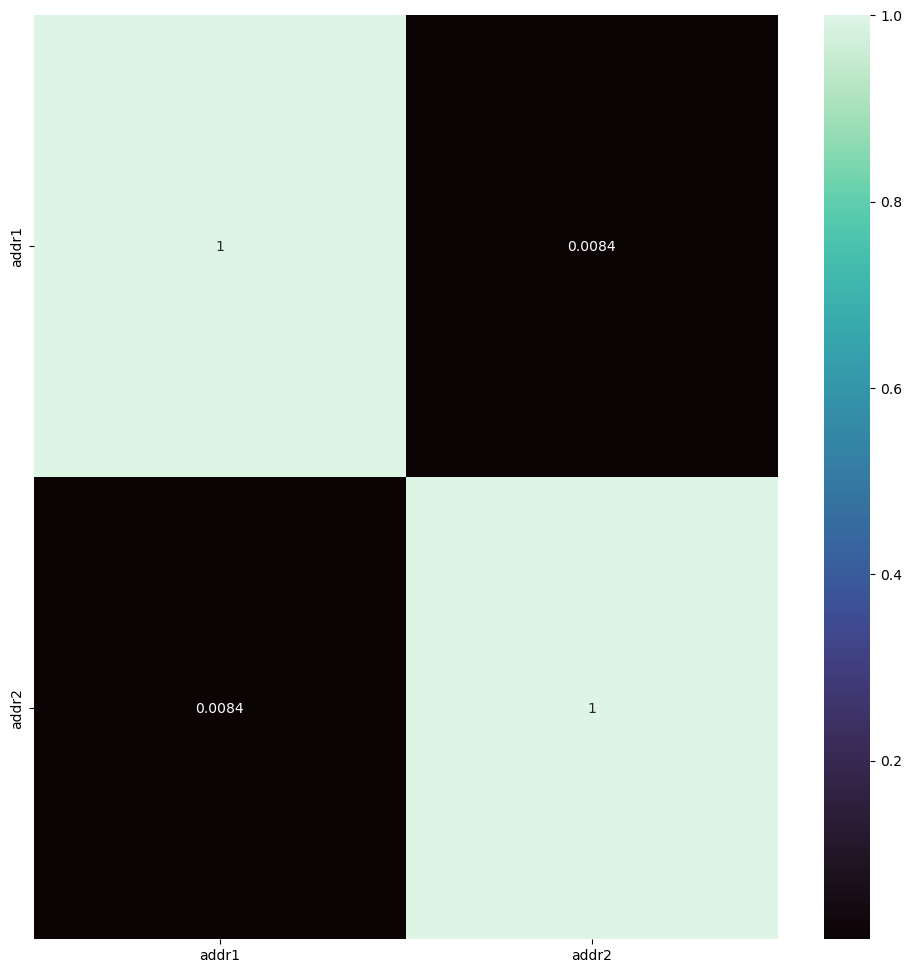

In [32]:
corr1 = df[['addr1', 'addr2']].corr()
plt.figure(figsize = (12,12))
ax = sns.heatmap(corr1, annot = True, cmap = 'mako')

As both the address columns are barely correlated, we cannot drop either of them, so we will fill the nan values with mean or mode or median.

In [33]:
df[['addr1', 'addr2']].describe()

,addr1,addr2
count,497484.000000,497484.000000
mean,291.834885,86.679803
std,102.401897,3.371963
min,100.000000,10.000000
25%,204.000000,87.000000
50%,299.000000,87.000000
75%,330.000000,87.000000
max,540.000000,102.000000


As both of the columns have their mean close to the 50 percentile, we can replace the nan values with mean.

In [34]:
df[['addr1', 'addr2']] = my_imputer.fit_transform(df[['addr1','addr2']])

In [35]:
df[['addr1', 'addr2']].isna().sum()

addr1    0
addr2    0
dtype: int64

In [36]:
df[['dist1']].describe()

,dist1
count,214614.000000
mean,129.539550
std,380.925814
min,0.000000
25%,3.000000
50%,9.000000
75%,28.000000
max,8081.000000


As this column is too erratic, we replace all the nan values with the mode value(most occuring value)

In [37]:
df[['dist1']] = my_imputer.fit_transform(df[['dist1']])

In [38]:
d_cols = [col for col in df.columns if col[0] == 'D' and len(col) <=3]
df[d_cols].head(10)

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
0,0.0,NaN,NaN,532.0,433.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,186.583328,0.583333,NaN,NaN,NaN,NaN,NaN,NaN
2,434.0,434.0,53.0,NaN,NaN,NaN,NaN,NaN,NaN,53.0,316.0,NaN,NaN,NaN,223.0
3,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
4,251.0,251.0,1.0,405.0,1.0,NaN,NaN,NaN,NaN,405.0,405.0,NaN,NaN,NaN,405.0
5,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0
6,195.0,40.0,7.0,196.0,5.0,NaN,NaN,NaN,NaN,30.0,196.0,NaN,NaN,NaN,35.0
7,0.0,NaN,NaN,0.0,NaN,NaN,NaN,44.875000,0.875000,0.0,NaN,NaN,0.0,NaN,0.0
8,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
9,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN


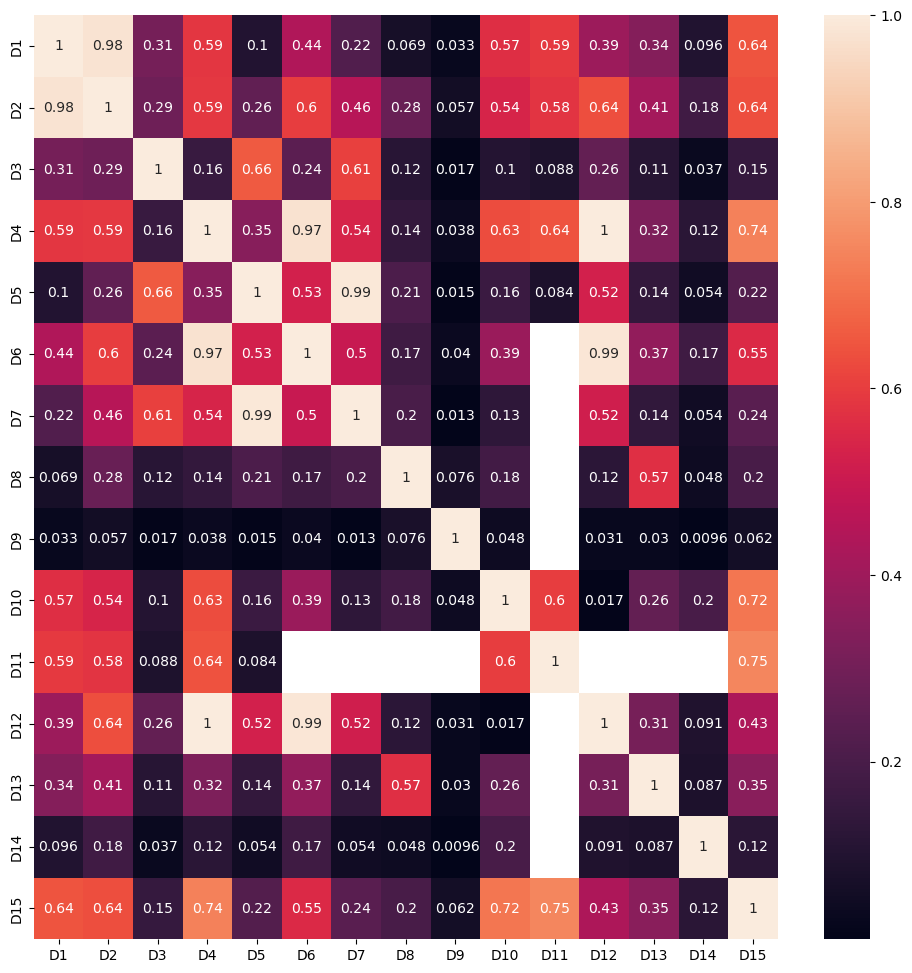

In [39]:
corr2 = df[d_cols].corr()
plt.figure(figsize = (12,12))
ax = sns.heatmap(corr2, annot = True)

These pair of columns have high correlation
* D4, D6
* D1, D2
* D12, D6
* D4, D12

So we can drop any one from these pairs.

In [40]:
del df['D6']
del df['D12']
del df['D2']

In [41]:
df.shape

(618533, 421)

In [42]:
df[['D1', 'D3','D4','D5','D8','D9','D10','D11','D13','D14','D15']].isna().sum()

D1        334
D3     292920
D4     179905
D5     314603
D8     487578
D9     487578
D10     92289
D11    339305
D13    508818
D14    504427
D15    105274
dtype: int64

In [43]:
df[['D3','D4','D5','D8','D9','D10','D11', 'D13','D14','D15']].describe()

,D3,D4,D5,D8,D9,D10,D11,D13,D14,D15
count,325613.000000,438628.000000,303930.000000,130955.000000,130955.000000,526244.000000,279228.000000,109715.000000,114106.000000,513259.000000
mean,23.697641,117.345183,32.331659,87.919563,0.533102,102.156298,133.938172,10.897689,53.498133,137.077544
std,58.129397,178.610175,79.292457,184.715529,0.327030,170.944280,180.076130,49.385818,127.483957,192.445625
min,0.000000,-122.000000,0.000000,0.000000,0.000000,0.000000,-33.000000,0.000000,0.000000,-74.000000
25%,0.000000,0.000000,0.000000,0.791666,0.166666,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.000000,8.000000,4.000000,7.333333,0.666666,1.000000,29.000000,0.000000,0.000000,19.000000
75%,20.000000,182.000000,23.000000,84.812500,0.833333,132.000000,241.000000,0.000000,7.000000,242.000000
max,784.000000,869.000000,819.000000,1638.875000,0.958333,876.000000,670.000000,847.000000,878.000000,878.000000


In [44]:
df[['D3','D4','D5','D8','D9','D10','D11','D13','D14','D15']].mode()

,D3,D4,D5,D8,D9,D10,D11,D13,D14,D15
0,0.0,0.0,0.0,0.958333,0.791666,0.0,0.0,0.0,0.0,0.0


In [45]:
df[['D3','D4','D5','D8','D9','D10','D11','D13','D14','D15']].median()

D3      5.000000
D4      8.000000
D5      4.000000
D8      7.333333
D9      0.666666
D10     1.000000
D11    29.000000
D13     0.000000
D14     0.000000
D15    19.000000
dtype: float64

We can clearly see that all of these columns are highly skewed as the mean is not even close to the 50 percentile.
As these are related to time intervals, we will use the median value to replace with all the nan values.

In [46]:
df[['D1','D3','D4','D5','D8','D9','D10','D11','D13','D14','D15']] = my_imputer.fit_transform(df[['D1','D3','D4','D5','D8','D9','D10','D11','D13','D14','D15']])

In [47]:
df[['D1','D3','D4','D5','D8','D9','D10','D11','D13','D14','D15']].isna().sum()

D1     0
D3     0
D4     0
D5     0
D8     0
D9     0
D10    0
D11    0
D13    0
D14    0
D15    0
dtype: int64

In [48]:
d_cols

['D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15']

In [49]:
c_cols = [col for col in train_df.columns if col[0] == 'C' and len(col) <=3]
m_cols = [col for col in df.columns if col[0] == 'M' and len(col) <=2]
v_cols = [col for col in df.columns if col[0] == 'V' and len(col) <=4]
id_cols = [col for col in df.columns if col[0] == 'i' and len(col) <=5]


In [50]:
df[c_cols].head(10)

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
1,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0
2,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,6.0,1.0
3,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0
4,2.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,0.0,90.0,2.0
5,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0
6,4.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,0.0,15.0,3.0
7,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0
8,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
9,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0


In [51]:
df[m_cols].head(10)

,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,T,T,F,M0,T,F,F,T,T
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,T,T,T,NaN,NaN,NaN,F,F,T
3,T,T,T,M1,T,F,NaN,NaN,NaN
4,T,T,T,M0,T,F,F,T,T
5,NaN,NaN,NaN,M2,NaN,NaN,NaN,NaN,NaN
6,T,T,T,M0,T,T,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,T,T,T,M0,F,T,T,T,T
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [52]:
df[m_cols].isna().sum()

M1    331350
M2    331350
M3    331350
M4    250834
M5    375397
M6    236193
M7    399378
M8    399369
M9    399369
dtype: int64

In [53]:
df['M1'].fillna(df['M1'].mode()[0], inplace=True)
df['M2'].fillna(df['M2'].mode()[0], inplace=True)
df['M3'].fillna(df['M3'].mode()[0], inplace=True)
df['M4'].fillna(df['M4'].mode()[0], inplace=True)
df['M5'].fillna(df['M5'].mode()[0], inplace=True)
df['M6'].fillna(df['M6'].mode()[0], inplace=True)
df['M7'].fillna(df['M7'].mode()[0], inplace=True)
df['M8'].fillna(df['M8'].mode()[0], inplace=True)
df['M9'].fillna(df['M9'].mode()[0], inplace=True)

In [54]:
df[v_cols].head(10)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,

In [55]:
nan_dict = {}
for col in v_cols:
    count = df[col].isnull().sum()
    try:
        nan_dict[count].append(col)
    except:
        nan_dict[count] = [col]
        
for k,v in nan_dict.items():
    print("")
    print(f'NAN count = {k} percent: {(int(k)/df.shape[0])*100} %')
    print(v)
    
print("")
print("Number of groups formed in v columns:")
print(len(nan_dict))


NAN count = 339305 percent: 54.85641024811934 %
['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']

NAN count = 92338 percent: 14.928548678890213 %
['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']

NAN count = 179937 percent: 29.09092966745509 %
['V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52']

NAN count = 98658 percent: 15.950321163139233 %
['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74']

NAN count = 105311 percent: 17.025930710245046 %
['V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94']

NAN count = 68 percent: 0.010993754577362888 %
['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 

In [56]:
def reduction(grps):
    use = []
    for col in grps:
        max_unique = 0
        max_index = 0
        for i,c in enumerate(col):
            n = df[c].nunique()
            if n > max_unique:
                max_unique = n
                max_index = i
        use.append(col[max_index])
    return use

## Group1 [V1 to V11]

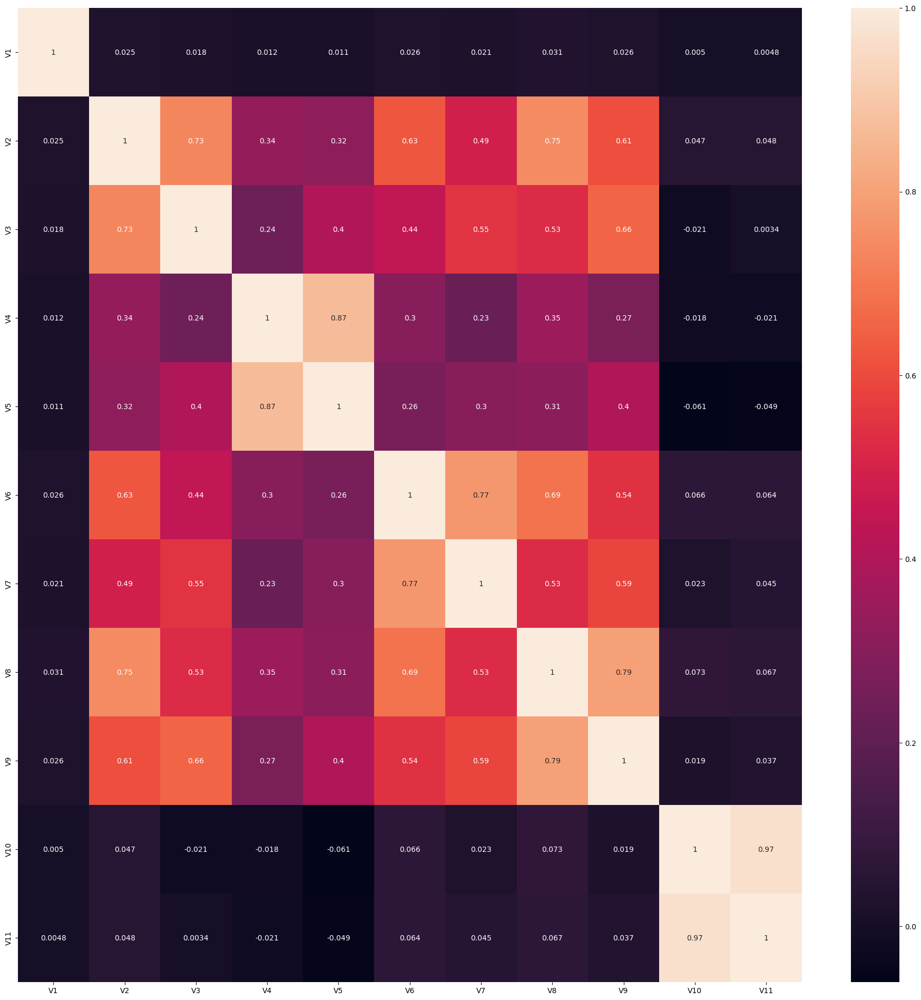

In [57]:
g1 = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']
corr = df[g1].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [58]:
pairs = [['V1'],['V2','V3'],['V4','V5'],['V6','V7'],['V8','V9'],['V10','V11']]
g1 = reduction(pairs)
g1

['V1', 'V3', 'V4', 'V6', 'V8', 'V11']

## Group2 [V12 - V34]

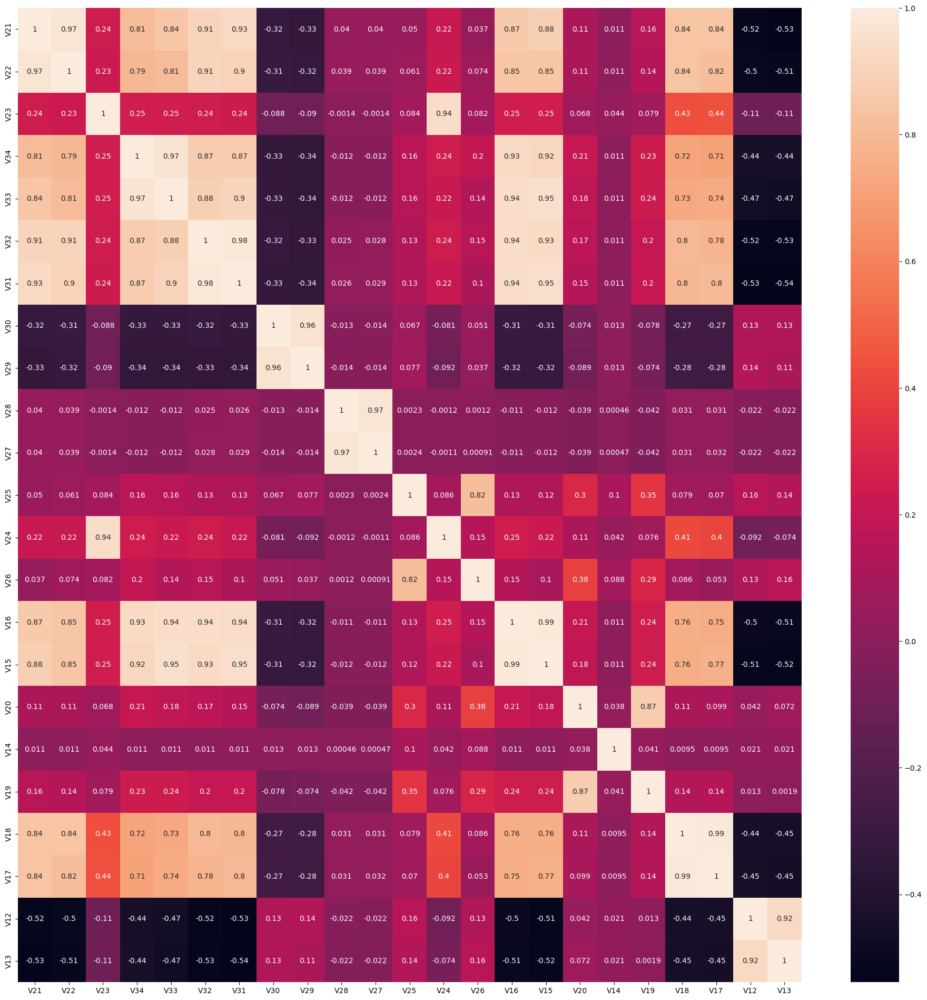

In [59]:
g2 = ['V21', 'V22', 'V23', 'V34', 'V33', 'V32','V31', 'V30', 'V29', 'V28', 'V27', 'V25', 'V24', 'V26', 'V16', 'V15', 
      'V20', 'V14', 'V19', 'V18', 'V17', 'V12', 'V13']
corr = df[g2].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [60]:
pairs = [['V12','V13'],['V14'],['V15','V16','V17','V18','V21','V22','V31','V32','V33','V34'],['V19','V20'],
         ['V23','V24'],['V25','V26'],['V27','V28'],['V29','V30']]

g2 = reduction(pairs)
g2

['V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30']

## Group3 [V35 - V52]

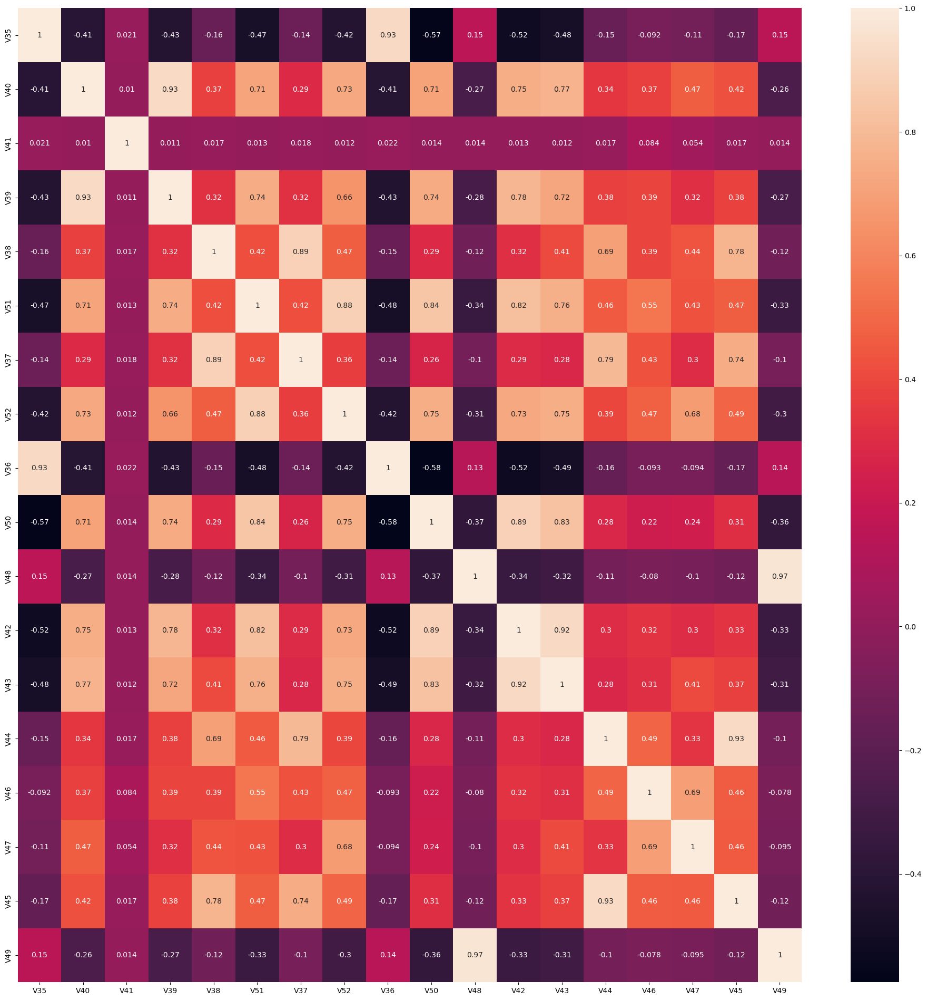

In [61]:
g3 = ['V35', 'V40', 'V41', 'V39', 'V38', 'V51', 'V37', 'V52', 'V36', 'V50', 'V48', 'V42',
 'V43', 'V44', 'V46', 'V47', 'V45', 'V49']

corr = df[g3].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)


In [62]:
pairs = [['V35','V36'],['V37','V38'],['V39','V40','V42','V43','V50','V51','V52'],['V41'],
         ['V44','V45'],['V46','V47'],['V48','V49']]

g3 = reduction(pairs)
g3


['V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48']

## Group4 [V52-V74]

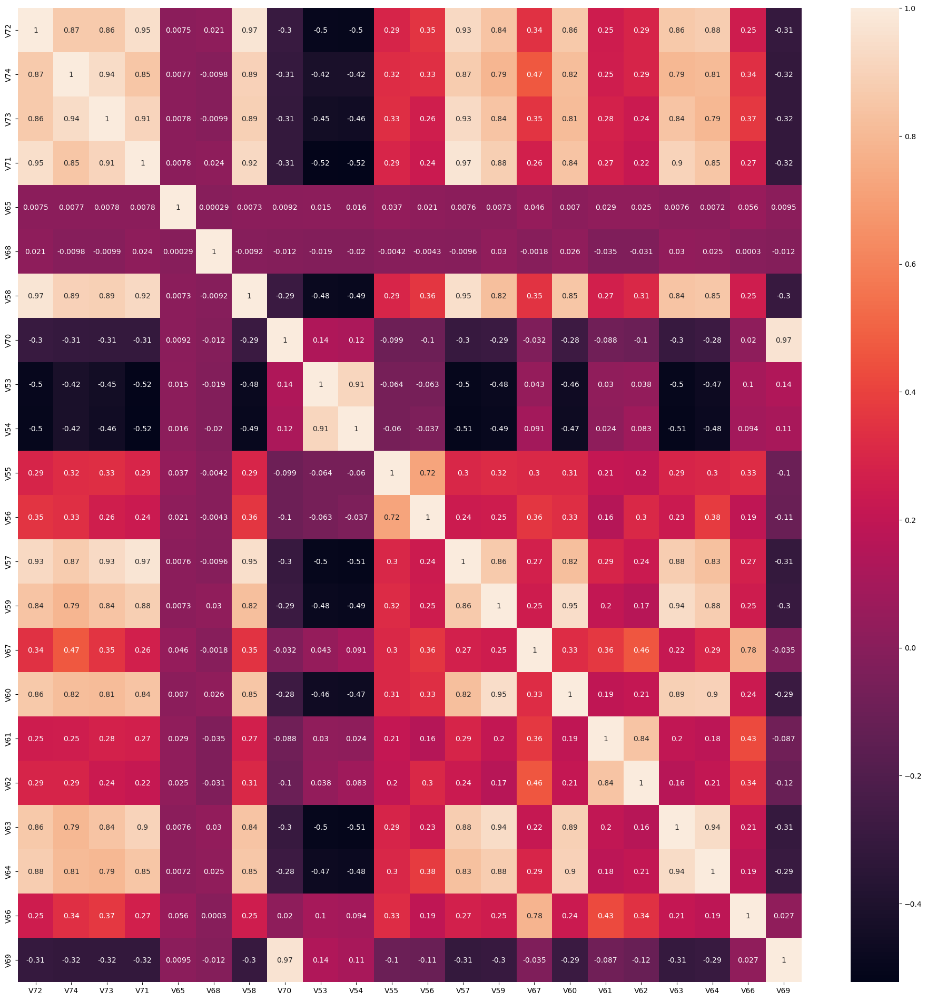

In [63]:
g4 = ['V72', 'V74', 'V73', 'V71', 'V65', 'V68', 'V58', 'V70', 'V53', 
 'V54', 'V55', 'V56', 'V57', 'V59', 'V67', 'V60', 'V61',
 'V62', 'V63', 'V64', 'V66', 'V69']

corr = df[g4].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)


In [64]:
pairs = [['V53','V54'],['V55'],['V56'],['V57', 'V58', 'V59', 'V60', 'V63', 'V64', 'V71', 'V72', 'V73', 'V74'],['V61','V62'],
 ['V65'],['V66','V67'],['V68'],['V69','V70']]

g4 = reduction(pairs)
g4


['V54', 'V55', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70']

## Group5 [V75 - V94]

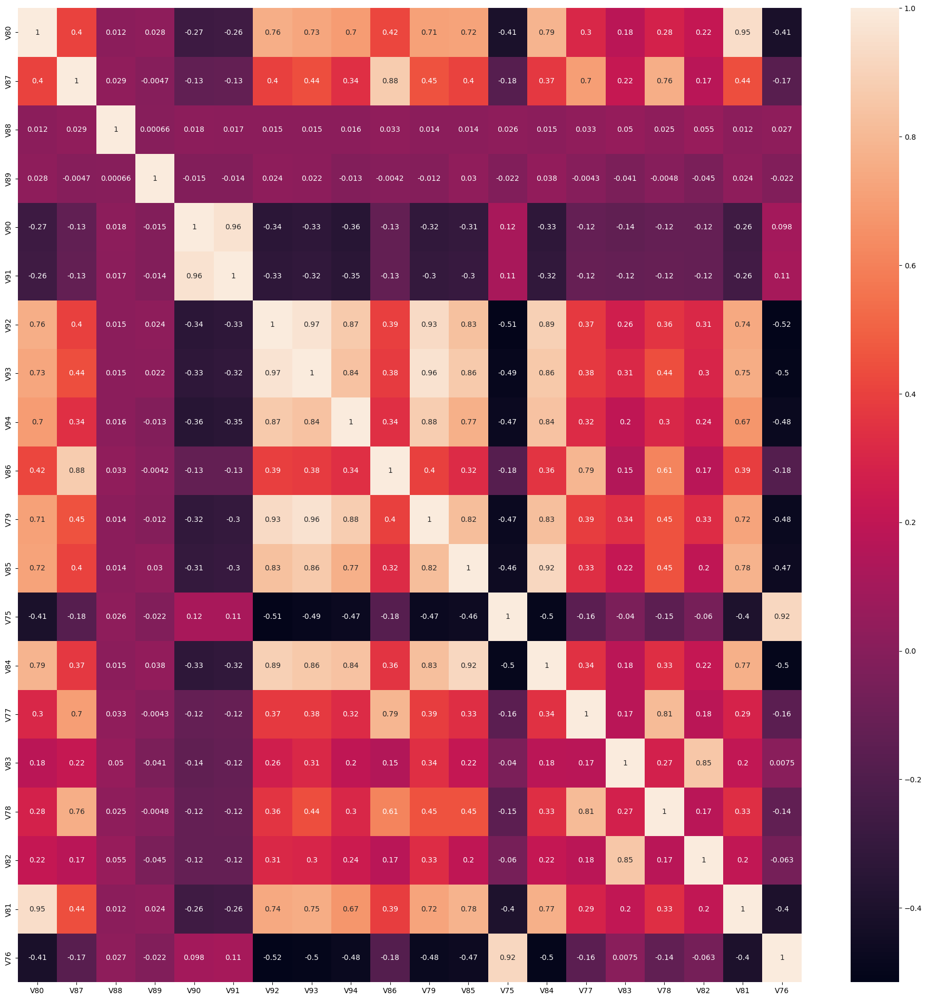

In [65]:
g5 = ['V80', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V86', 'V79',
 'V85', 'V75', 'V84', 'V77', 'V83', 'V78', 'V82', 'V81', 'V76']

corr = df[g5].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [66]:
pairs = [['V75','V76'],['V77','V78'],['V79','V80','V81','V84','V85','V92','V93','V94'],['V82','V83'],['V86','V87'],
         ['V88'],['V89'],['V90','V91']]

g5 = reduction(pairs)
g5

['V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91']

## Group6 [V95 - V137]

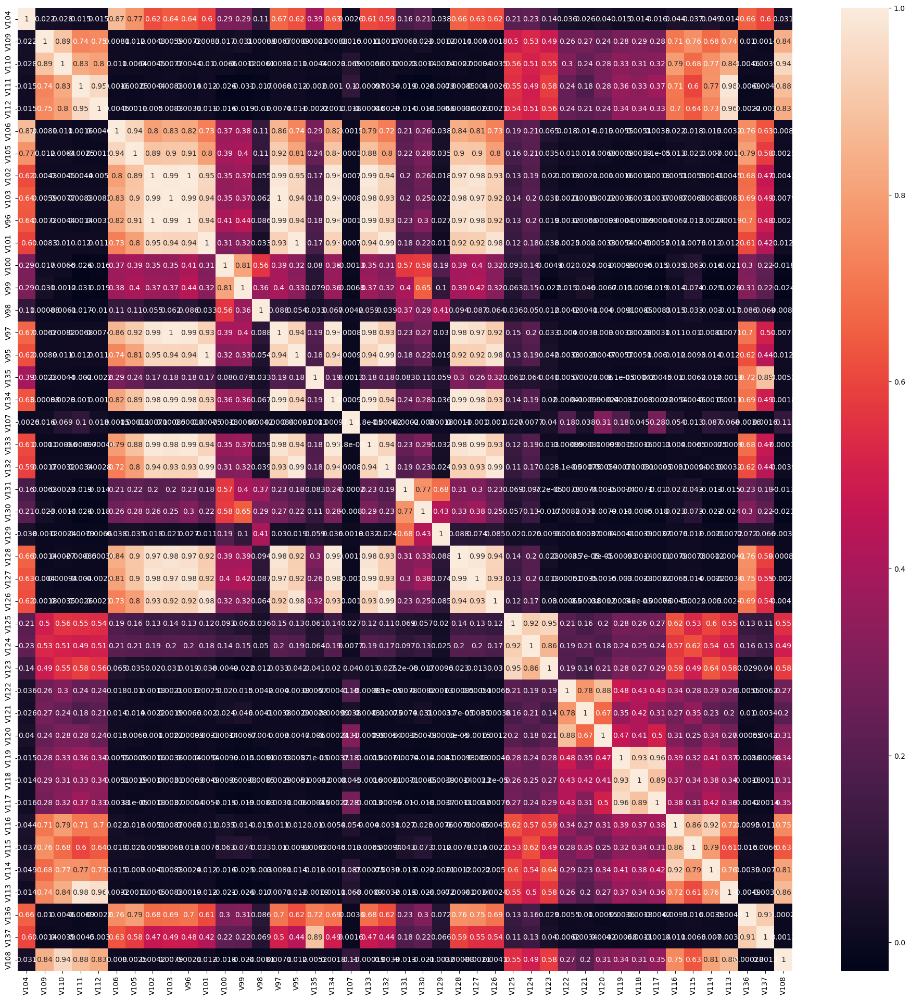

In [67]:
g6 = ['V104', 'V109', 'V110', 'V111', 'V112', 'V106', 'V105', 'V102', 'V103', 'V96', 'V101', 'V100',
        'V99', 'V98', 'V97', 'V95', 'V135', 'V134', 'V107', 'V133', 'V132', 'V131', 'V130', 'V129', 
        'V128', 'V127', 'V126', 'V125', 'V124', 'V123', 'V122', 'V121', 
        'V120', 'V119', 'V118', 'V117', 'V116', 'V115', 'V114', 'V113', 'V136', 'V137', 'V108']

corr = df[g6].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

As this is a large group, we will further reduce it to 3 small groups

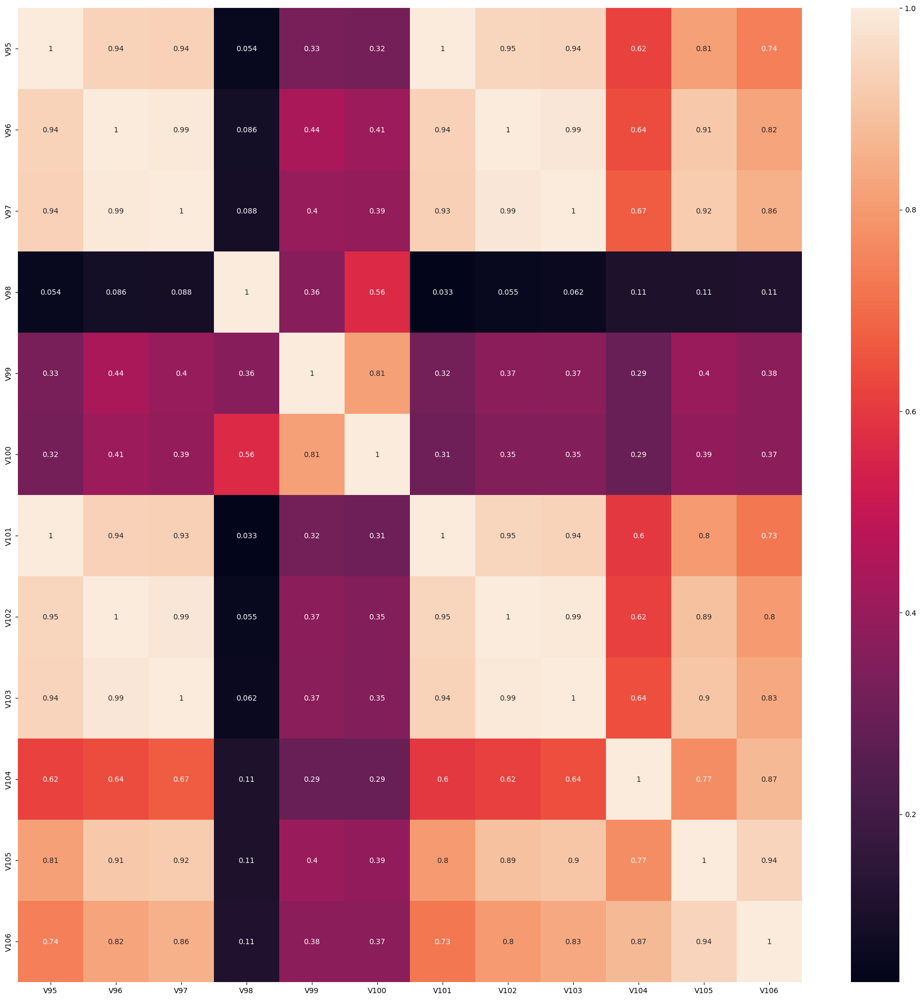

In [68]:
g6_1 = ['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106']

corr = df[g6_1].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [69]:
pairs = [['V99','V100'],['V98'],['V104'],['V95','V96','V97','V101','V102','V103','V105','V106']]

g6_1 = reduction(pairs)
g6_1

['V99', 'V98', 'V104', 'V96']

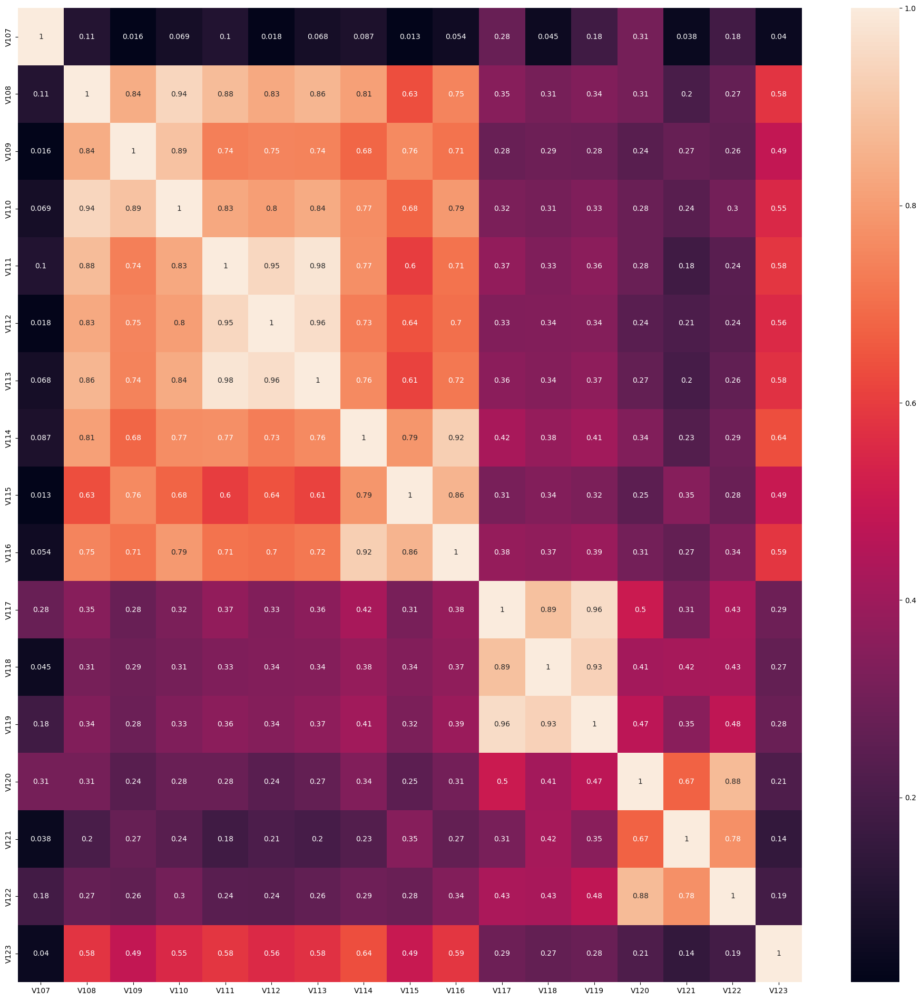

In [70]:
g6_2 = ['V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123']

corr = df[g6_2].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [71]:
pairs = [['V107'],['V108','V109','V110','V114'],['V111','V112','V113'],['V115','V116'],['V117','V118','V119'],['V120','V122'],['V121'],['V123']]

g6_2 = reduction(pairs)
g6_2

['V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123']

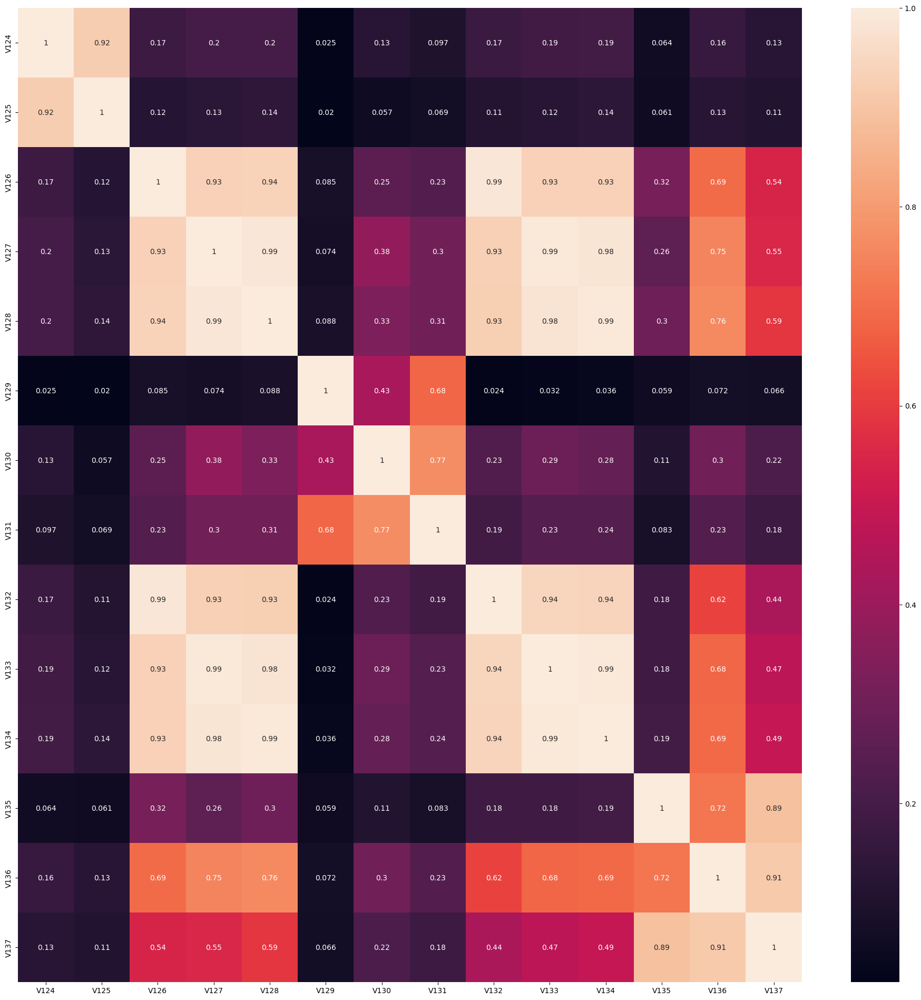

In [72]:
g6_3 = ['V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137']

corr = df[g6_3].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [73]:
pairs = [['V124','V125'],['V126','V127','V128','V132','V133','V134'],['V129'],['V130','V131'],['V135','V136','V137']]

g6_3 = reduction(pairs)
g6_3

['V124', 'V127', 'V129', 'V130', 'V136']

## Group7 [V138 ~ V163]

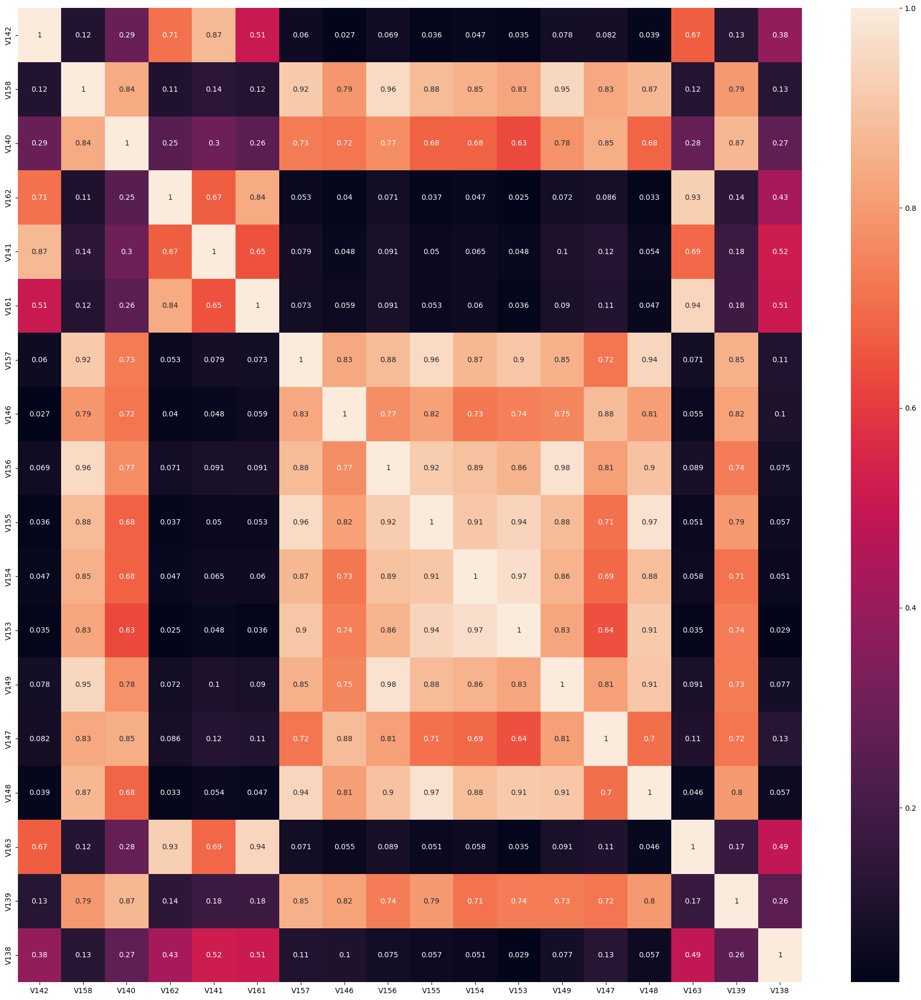

In [74]:
g7 = ['V142', 'V158', 'V140', 'V162', 'V141', 'V161', 'V157', 'V146', 'V156', 'V155', 'V154',
        'V153', 'V149', 'V147', 'V148', 'V163', 'V139', 'V138']

corr = df[g7].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [75]:
pairs = [['V138'],['V139','V140'],['V141','V142'],['V146','V147'],['V148','V149','V153','V154','V156','V157','V158'],['V161','V162','V163']]

g7 = reduction(pairs)
g7

['V138', 'V139', 'V142', 'V147', 'V156', 'V162']

##  Group8 [V143 ~ V166]

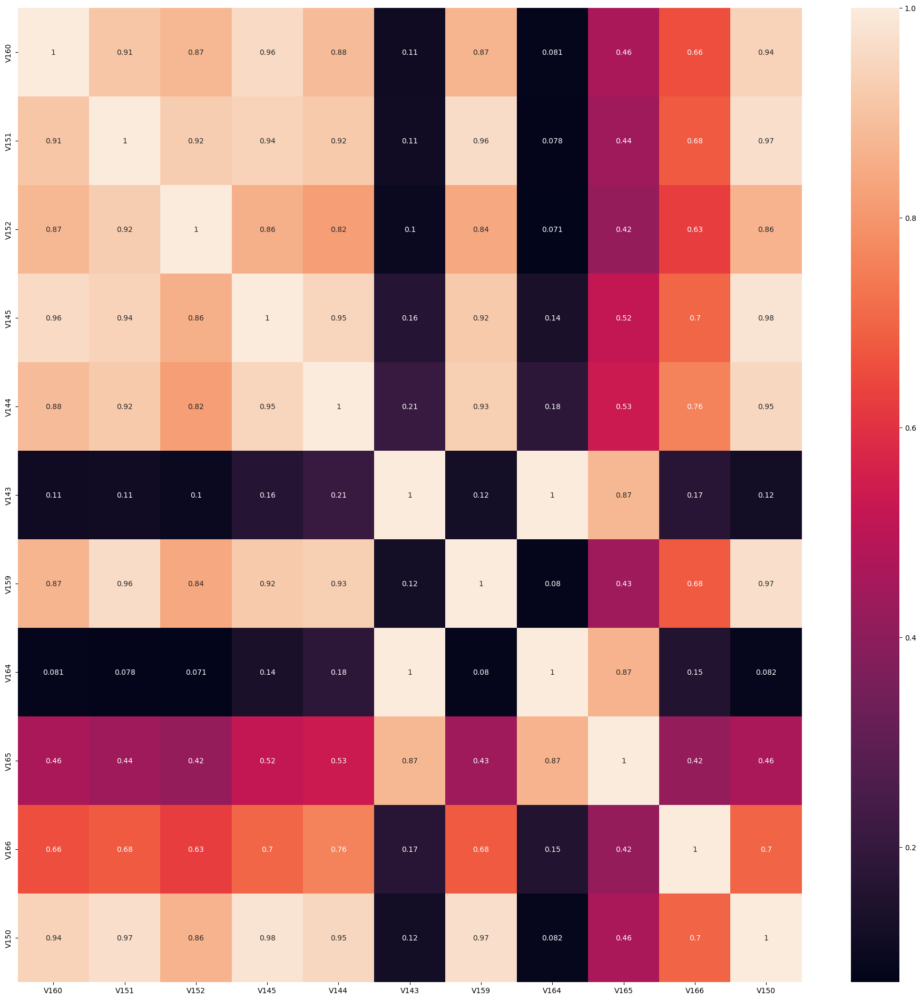

In [76]:
g8 = ['V160', 'V151', 'V152', 'V145', 'V144', 'V143', 'V159', 'V164', 'V165', 'V166', 'V150']

corr = df[g8].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [77]:
pairs = [['V143','V164','V165'],['V144','V145','V150','V151','V152','V159','V160'],['V166']]

g8 = reduction(pairs)
g8

['V165', 'V160', 'V166']

## Group9 [V167 ~ V216]

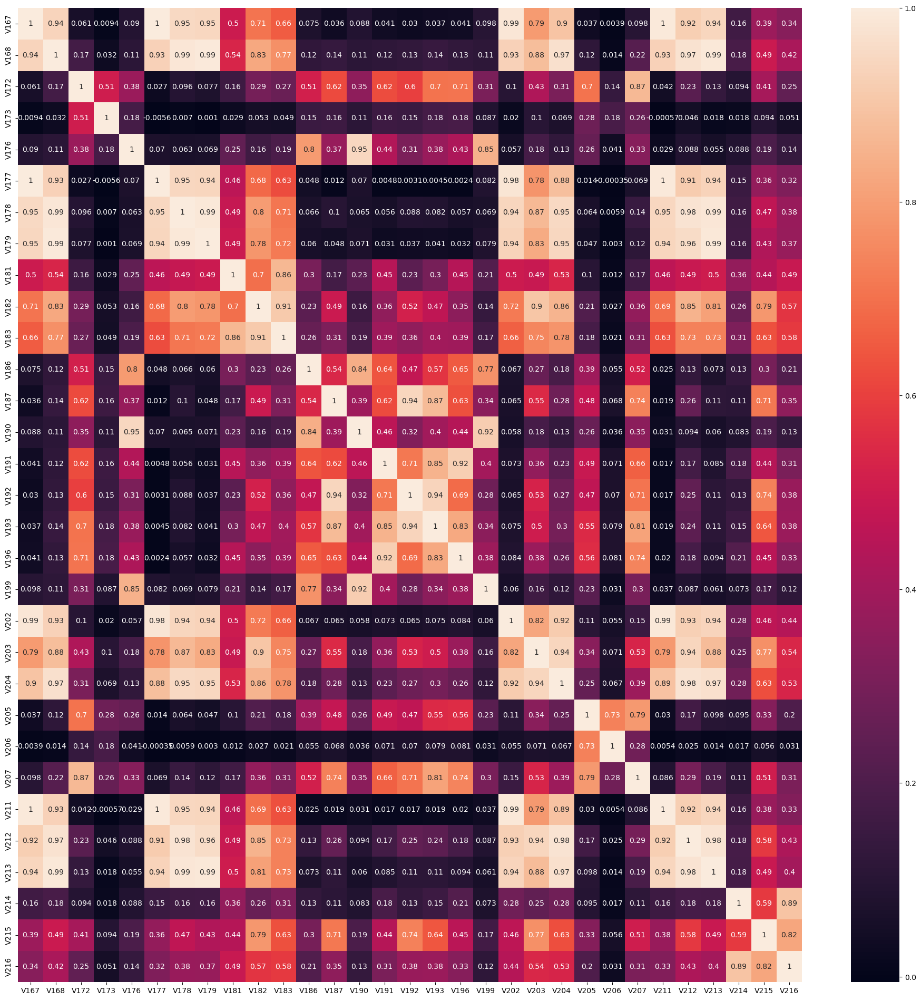

In [78]:
g9 = ['V167', 'V168', 'V172', 'V173', 'V176', 'V177', 'V178', 'V179', 'V181', 'V182', 'V183', 'V186', 
      'V187', 'V190', 'V191', 'V192', 'V193', 'V196', 'V199', 'V202', 'V203', 'V204', 'V205', 'V206', 
      'V207', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216']

corr = df[g9].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

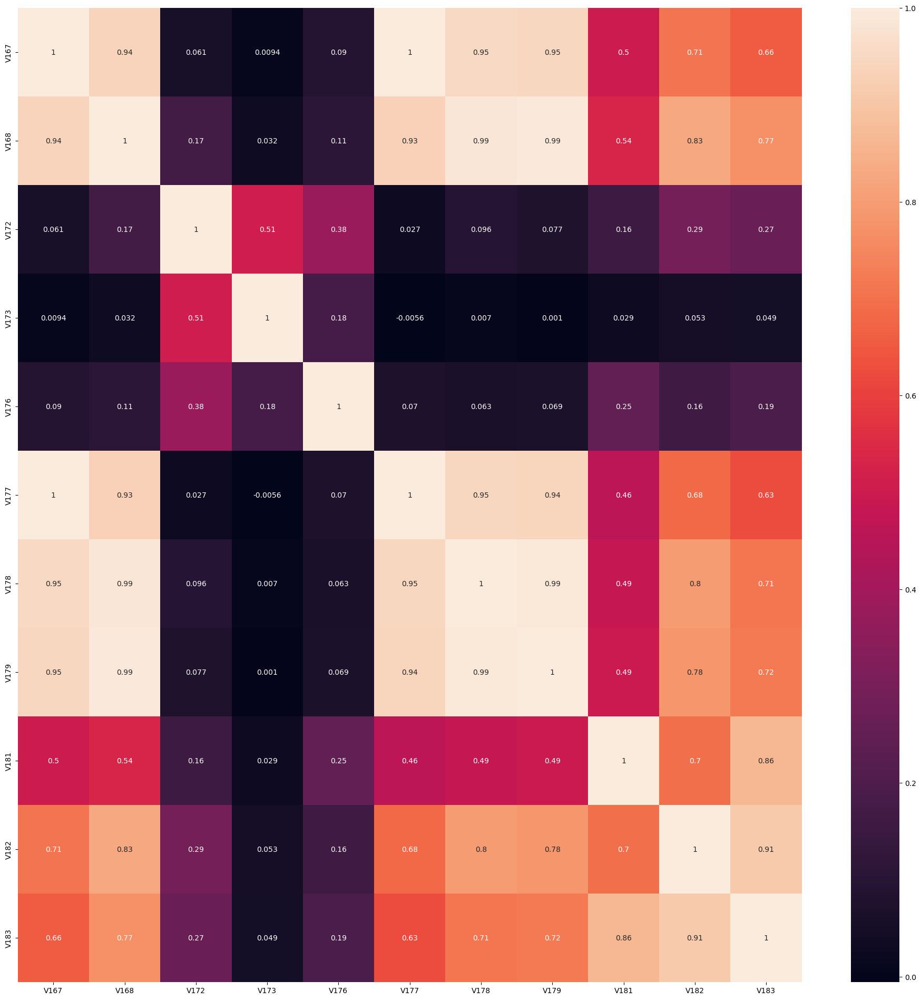

In [79]:
g9_1 = ['V167', 'V168','V172','V173','V176','V177','V178','V179','V181','V182','V183']

corr = df[g9_1].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [80]:
pairs = [['V167','V168','V177','V178','V179'],['V172','V176'],['V173'],['V181','V182','V183']]

g9_1 = reduction(pairs)
g9_1

['V178', 'V176', 'V173', 'V182']

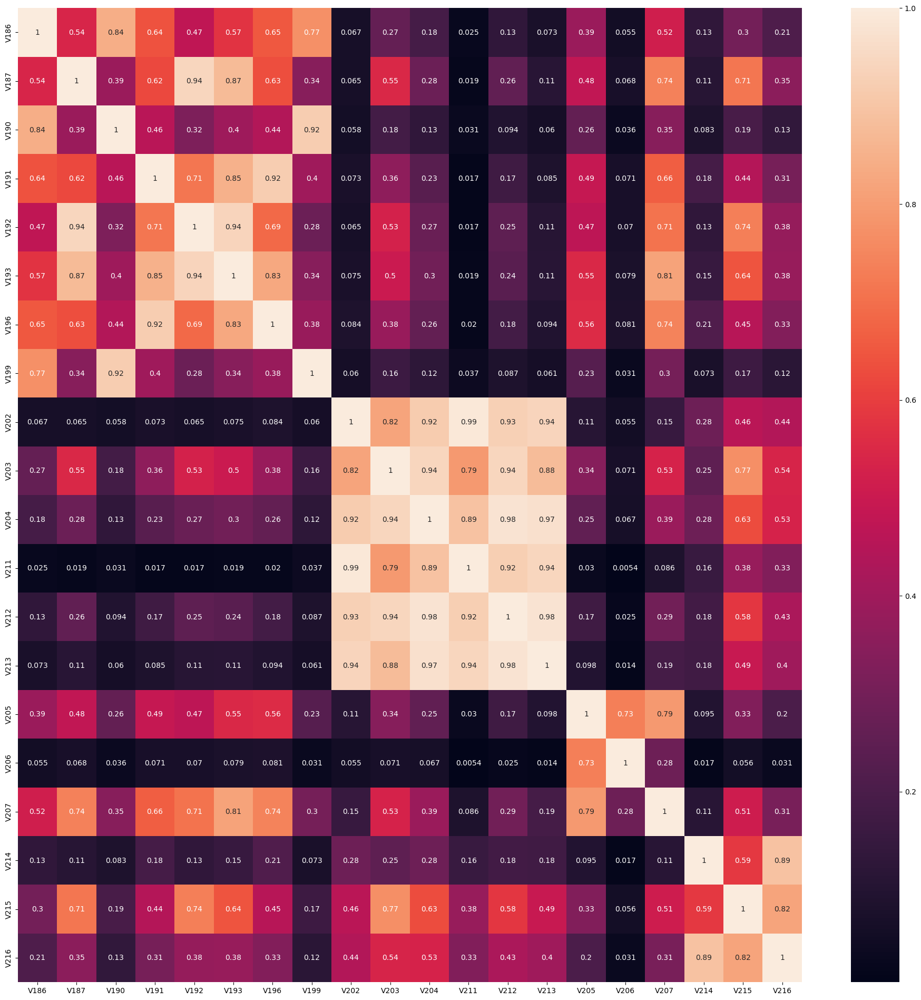

In [81]:
g9_2 = ['V186','V187','V190','V191','V192','V193','V196','V199','V202','V203','V204','V211','V212','V213','V205','V206','V207','V214','V215','V216']

corr = df[g9_2].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [82]:
pairs = [['V186','V187','V190','V191','V192','V193','V196','V199'],['V202','V203','V204','V211','V212','V213'],
         ['V205','V206'],['V207'],['V214','V215','V216']]

g9_2 = reduction(pairs)
g9_2

['V187', 'V203', 'V205', 'V207', 'V215']

## Group10 [V169 ~ V210]

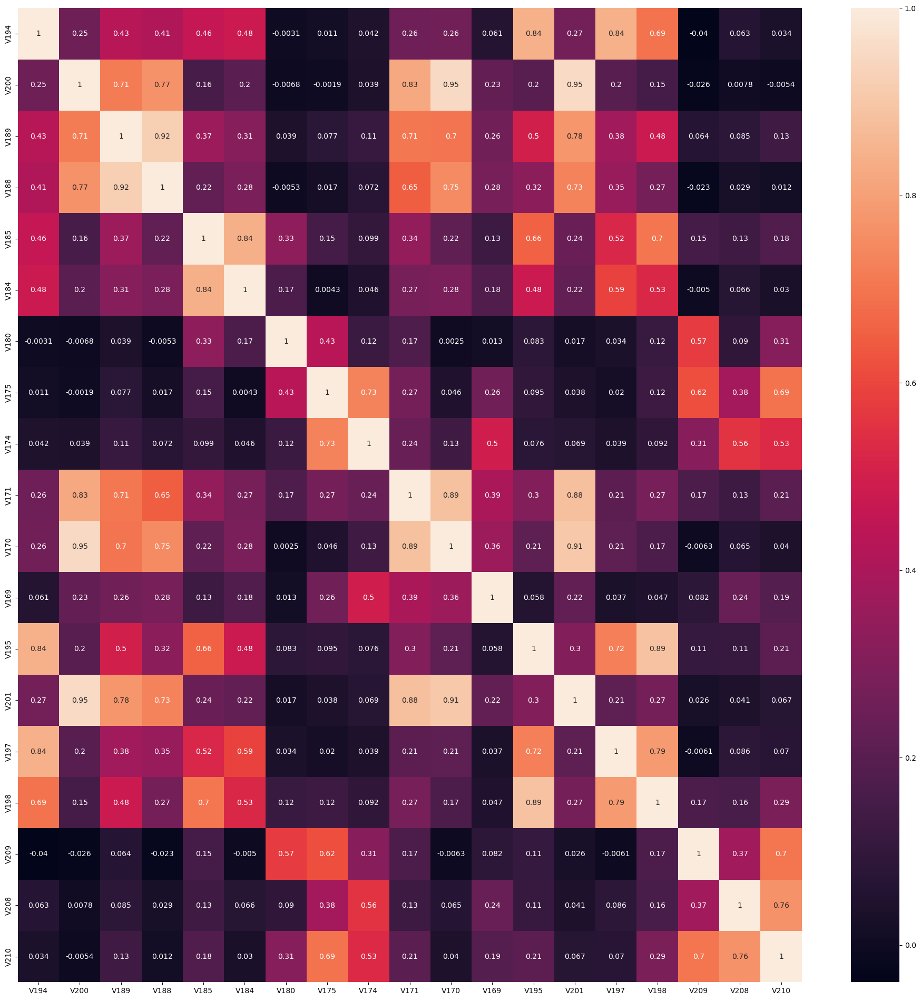

In [83]:
g10 = ['V194', 'V200', 'V189', 'V188', 'V185', 'V184', 'V180', 'V175', 'V174', 'V171',
        'V170', 'V169', 'V195', 'V201', 'V197', 'V198', 'V209', 'V208', 'V210']

corr = df[g10].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [84]:
pairs = [['V169'],['V170','V171','V200','V201'],['V174','V175'],['V180'],['V184','V185'],['V188','V189'],['V194','V195','V197','V198'],['V208','V210'],
         ['V209']]

g10 = reduction(pairs)
g10

['V169', 'V171', 'V175', 'V180', 'V185', 'V188', 'V198', 'V210', 'V209']

## group11 [V217 ~ V278]

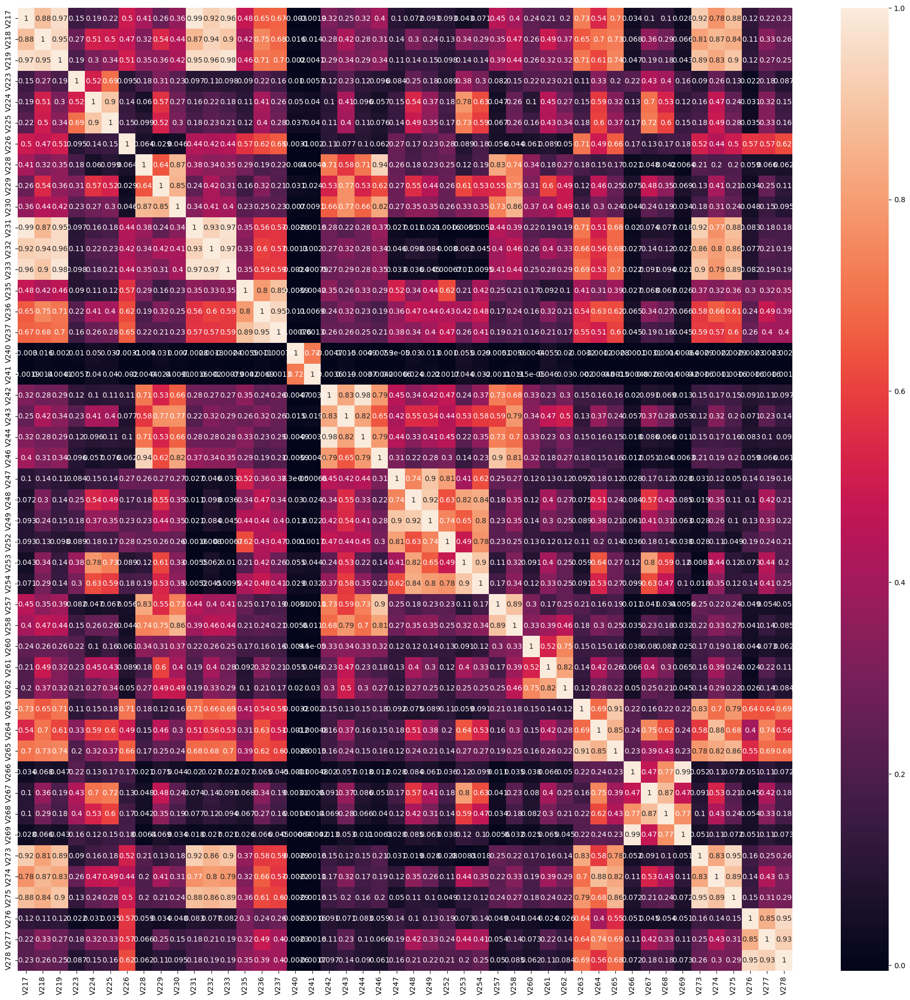

In [85]:
g11 = ['V217', 'V218', 'V219', 'V223', 'V224', 'V225', 'V226', 'V228', 'V229', 'V230', 'V231',
       'V232', 'V233', 'V235', 'V236', 'V237', 'V240', 'V241', 'V242', 'V243', 'V244', 'V246', 
       'V247', 'V248', 'V249', 'V252', 'V253', 'V254', 'V257', 'V258', 'V260', 'V261', 'V262', 'V263', 'V264', 
       'V265', 'V266', 'V267', 'V268', 'V269', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278']

corr = df[g11].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

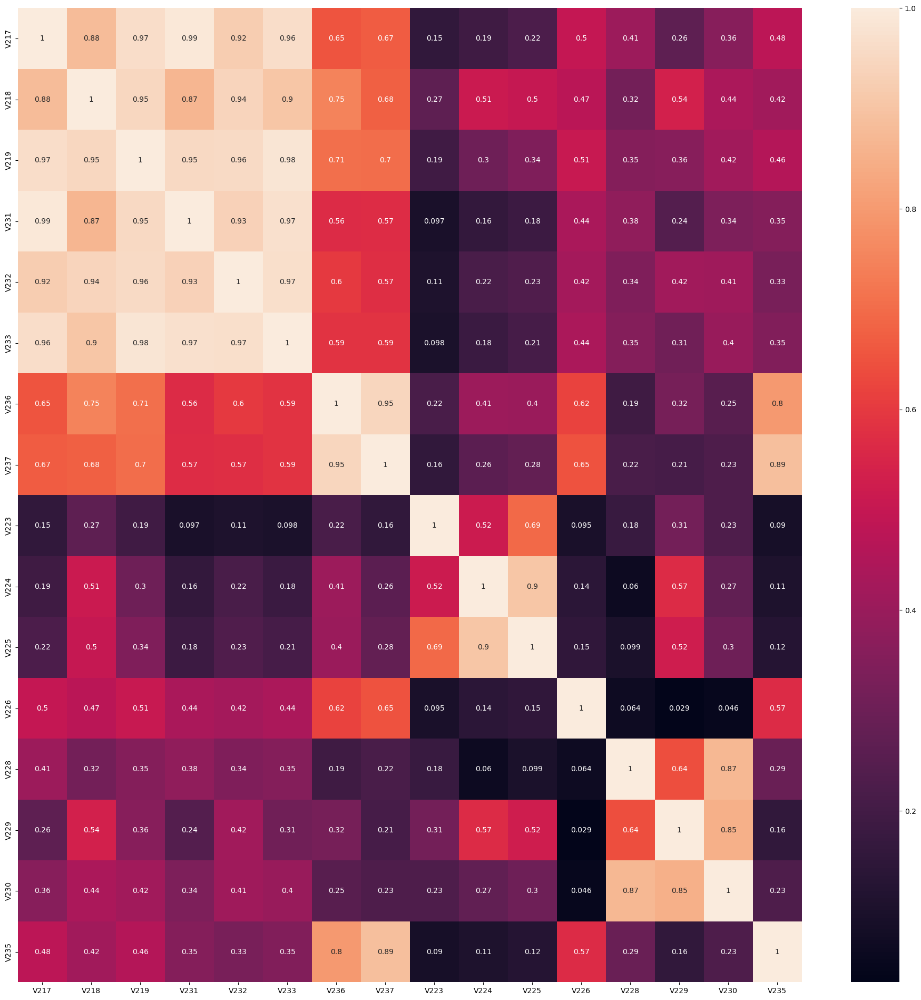

In [86]:
g11_1 = ['V217','V218','V219','V231','V232','V233','V236','V237','V223','V224','V225','V226','V228','V229','V230','V235']

corr = df[g11_1].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [87]:
pairs = [['V217','V218','V219','V231','V232','V233','V236','V237'],['V223'],['V224','V225'],['V226'],['V228'],['V229','V230'],['V235']]

g11_1 = reduction(pairs)
g11_1

['V218', 'V223', 'V224', 'V226', 'V228', 'V229', 'V235']

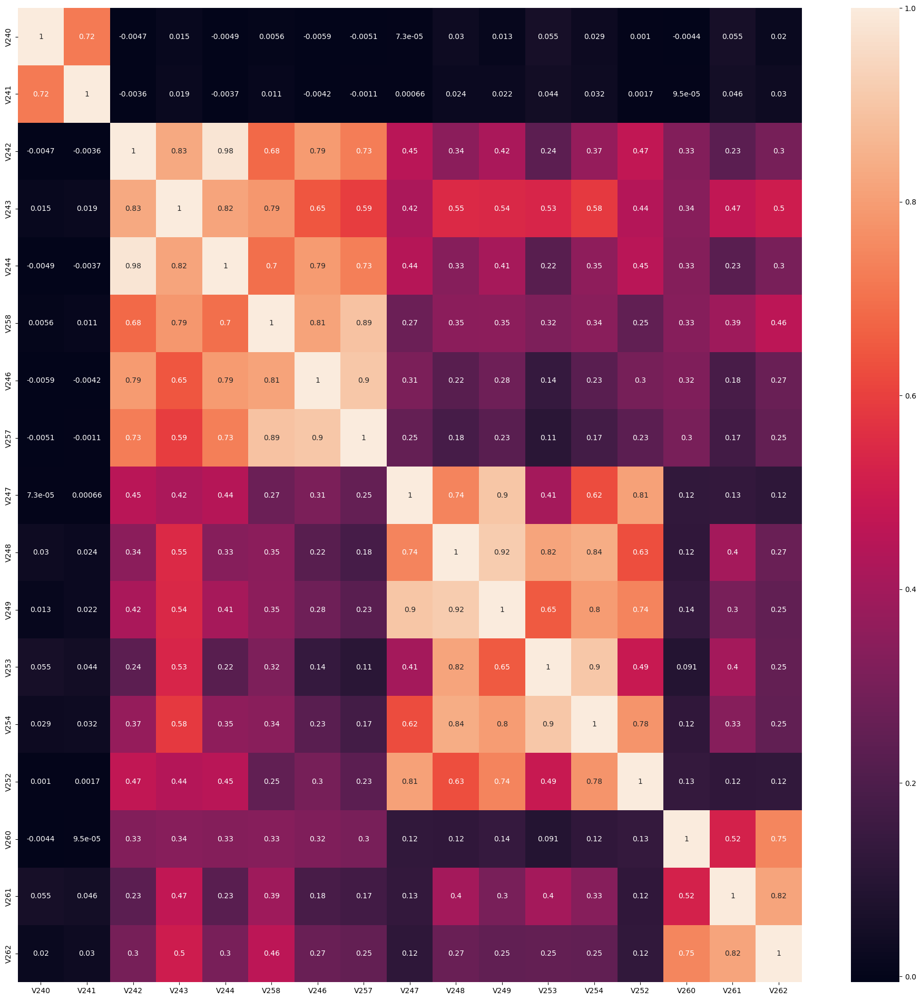

In [88]:
g11_2 = ['V240','V241','V242','V243','V244','V258','V246','V257','V247','V248','V249','V253','V254','V252','V260','V261','V262']

corr = df[g11_2].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [89]:
pairs = [['V240','V241'],['V242','V243','V244','V258'],['V246','V257'],['V247','V248','V249','V253','V254'],['V252'],['V260'],['V261','V262']]

g11_2 = reduction(pairs)
g11_2

['V240', 'V258', 'V257', 'V253', 'V252', 'V260', 'V261']

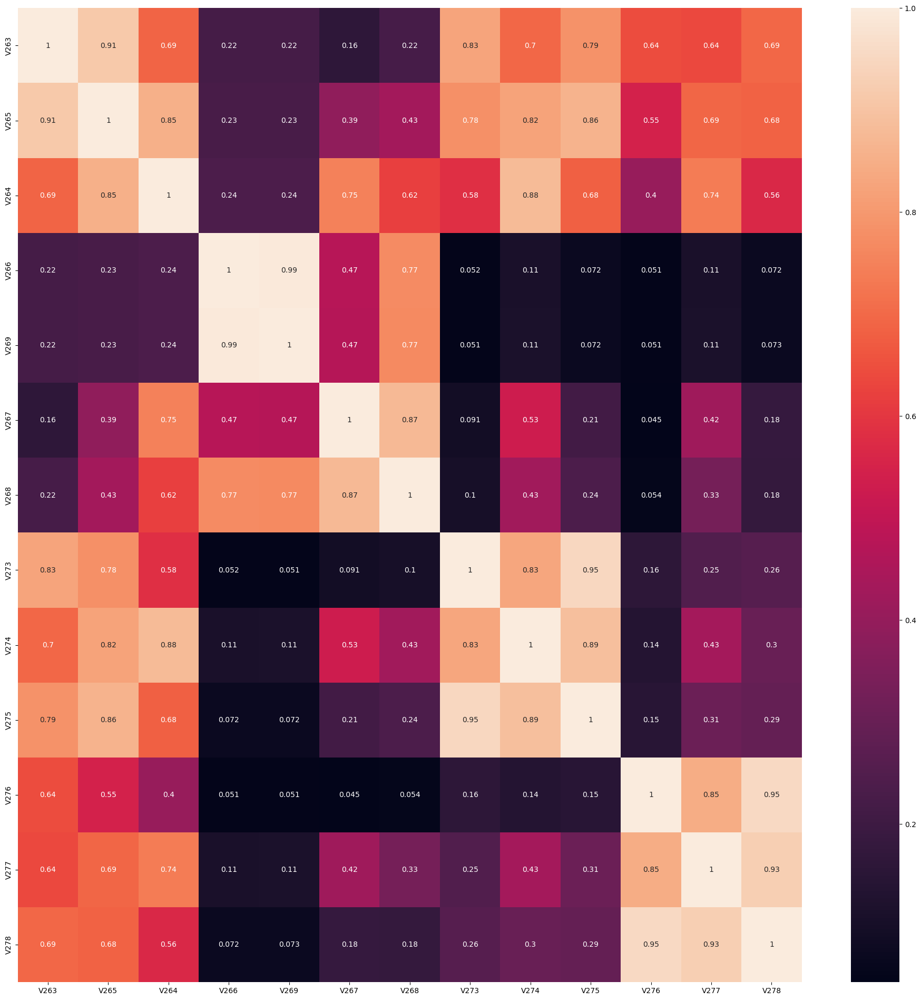

In [90]:
g11_3 =  ['V263','V265','V264','V266','V269','V267','V268','V273','V274','V275','V276','V277','V278']

corr = df[g11_3].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [91]:
pairs =[['V263','V265','V264'],['V266','V269'],['V267','V268'],['V273','V274','V275'],['V276','V277','V278']]

g11_3 = reduction(pairs)
g11_3

['V264', 'V266', 'V267', 'V274', 'V277']

## Group12 [V220 ~ V272]

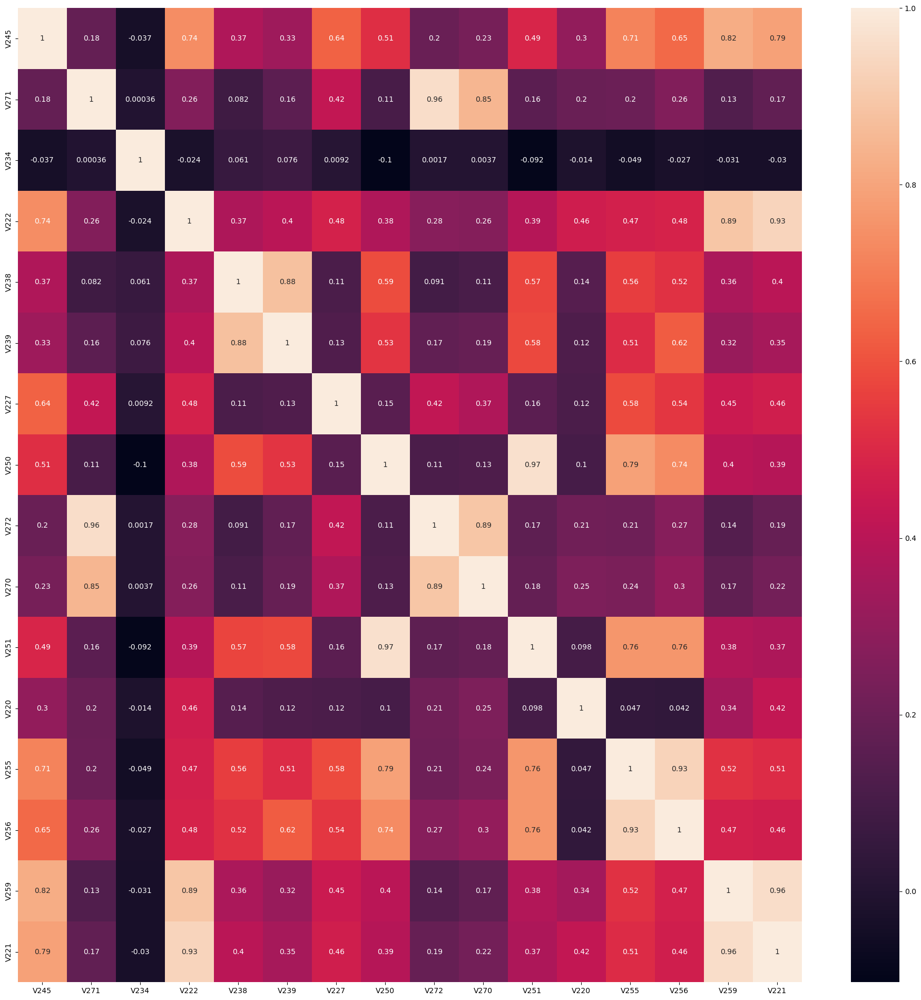

In [92]:
g12 = ['V245', 'V271', 'V234', 'V222', 'V238', 'V239', 'V227', 'V250','V272', 'V270', 'V251', 'V220', 'V255', 'V256', 'V259', 'V221']

corr = df[g12].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [93]:
pairs = [['V220'],['V221','V222','V227','V245','V255','V256','V259'],['V234'],['V238','V239'],['V250','V251'],['V270','V271','V272']]

g12 = reduction(pairs)
g12

['V220', 'V221', 'V234', 'V238', 'V250', 'V271']

## Group13 [V279 ~ V321]

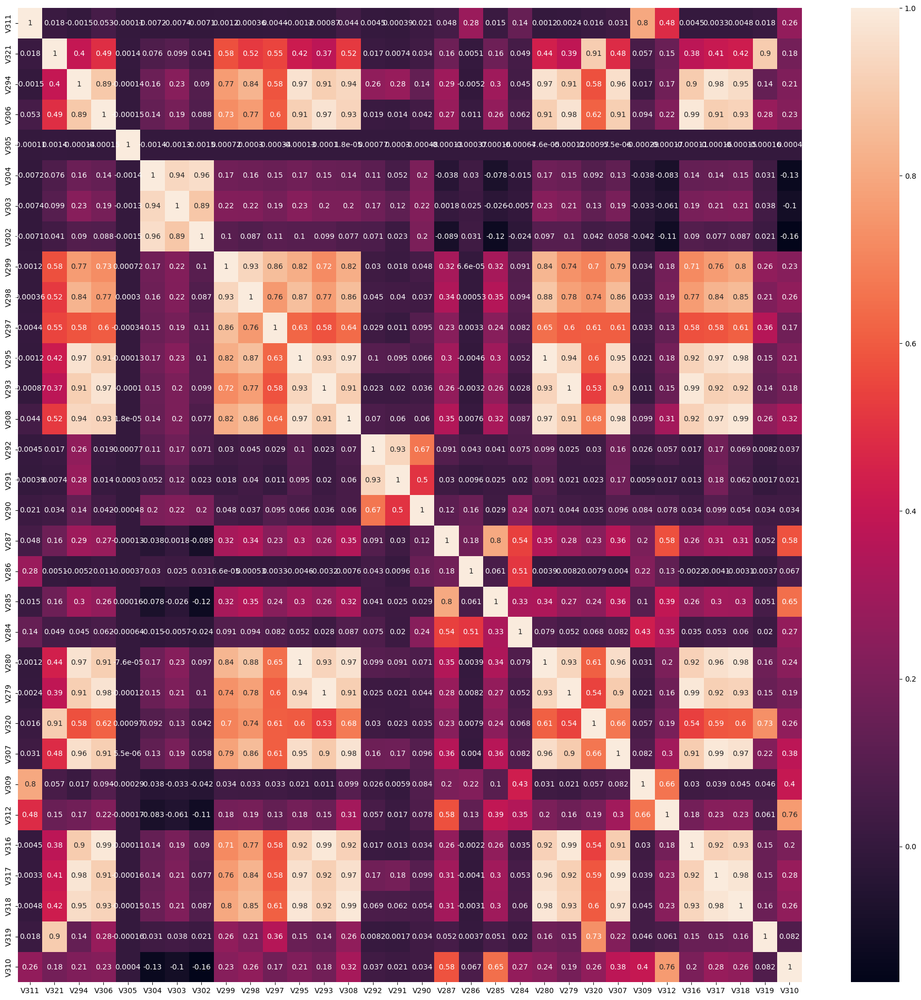

In [94]:
g13 = ['V311', 'V321', 'V294', 'V306', 'V305', 'V304', 'V303', 'V302', 'V299', 'V298', 'V297', 'V295', 
        'V293', 'V308', 'V292', 'V291', 'V290', 'V287', 'V286', 'V285', 'V284', 'V280', 'V279', 
        'V320', 'V307', 'V309', 'V312', 'V316', 'V317', 'V318', 'V319', 'V310']

corr = df[g13].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

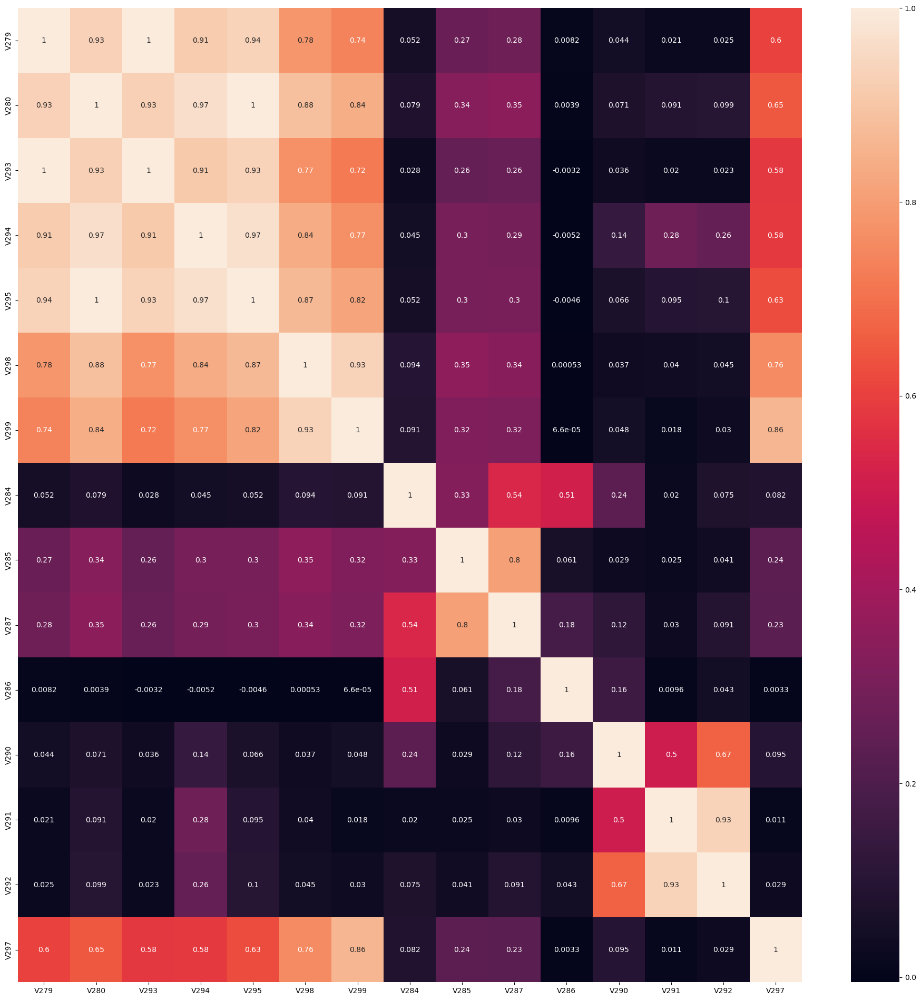

In [95]:
g13_1 = ['V279','V280','V293','V294','V295','V298','V299','V284','V285','V287','V286','V290','V291','V292','V297']

corr = df[g13_1].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [96]:
pairs = [['V279','V280','V293','V294','V295','V298','V299'],['V284'],['V285','V287'],['V286'],['V290','V291','V292'],['V297']]

g13_1 = reduction(pairs)
g13_1

['V294', 'V284', 'V285', 'V286', 'V291', 'V297']

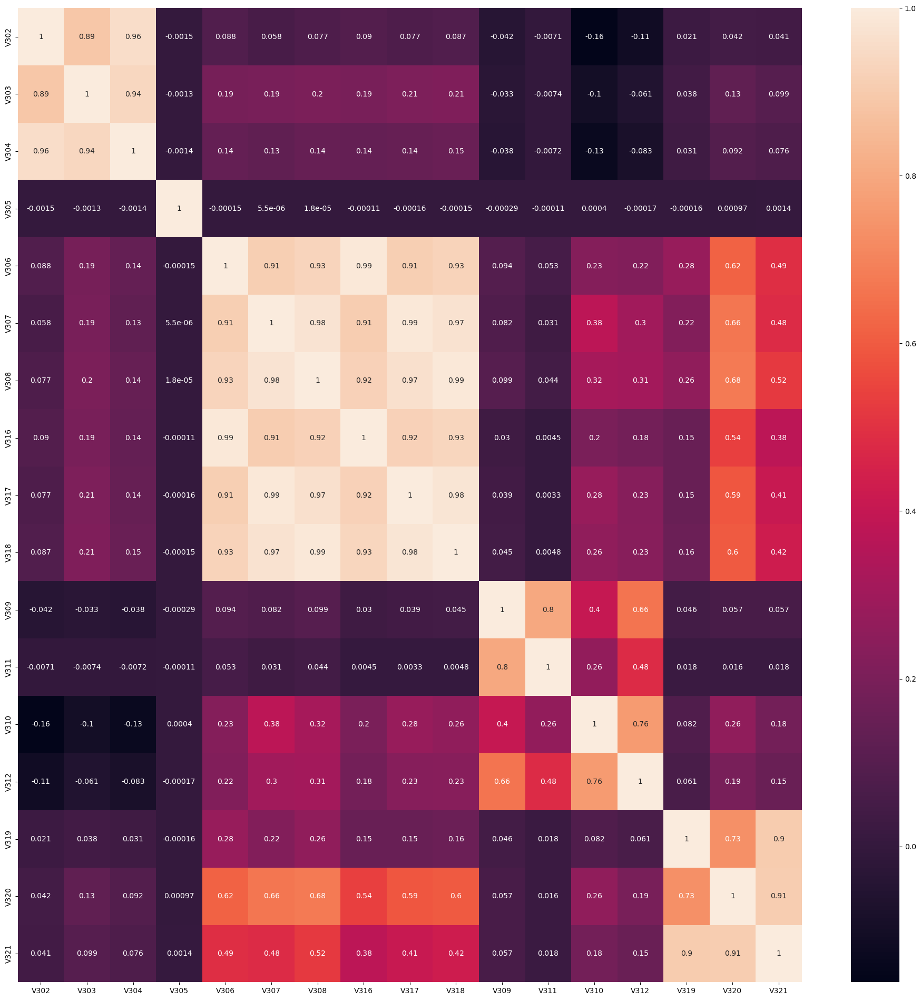

In [97]:
g13_2 = ['V302','V303','V304','V305','V306','V307','V308','V316','V317','V318','V309','V311','V310','V312','V319','V320','V321']

corr = df[g13_2].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [98]:
pairs = [['V302','V303','V304'],['V305'],['V306','V307','V308','V316','V317','V318'],['V309','V311'],['V310','V312'],['V319','V320','V321']]

g13_2 = reduction(pairs)
g13_2

['V303', 'V305', 'V307', 'V309', 'V310', 'V320']

## Group14 [V281-V313]

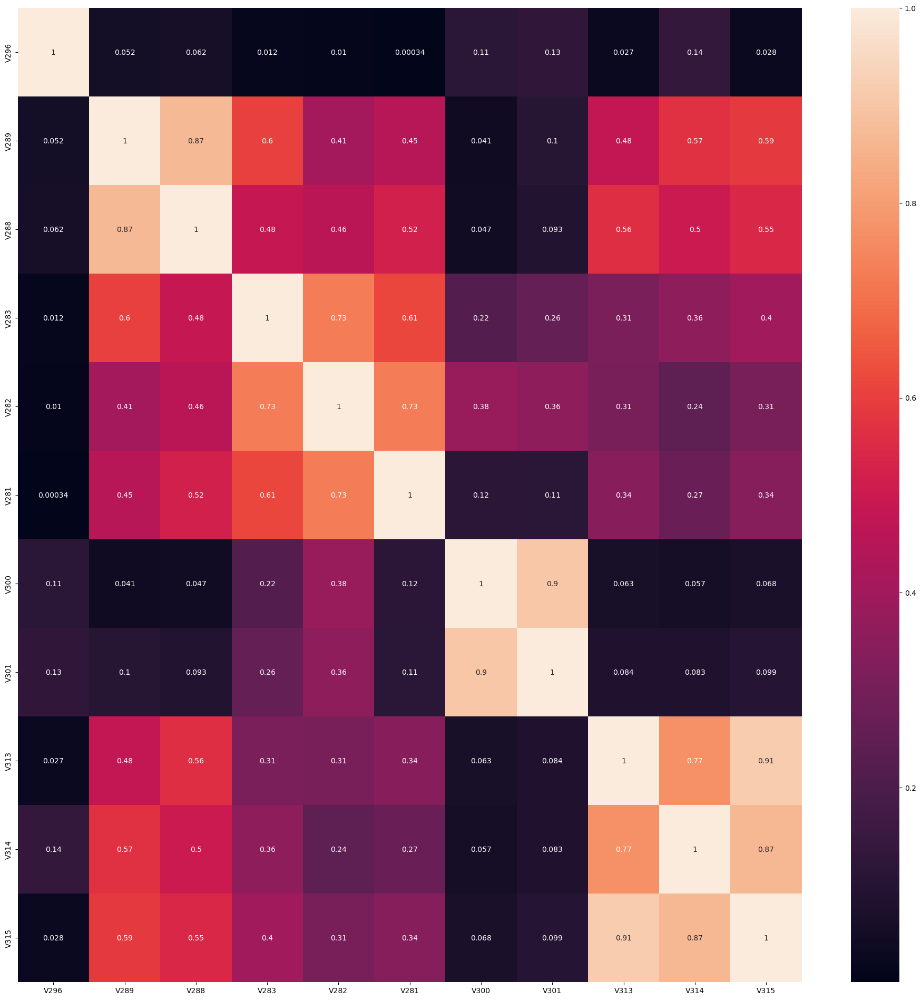

In [99]:
g14 = ['V296', 'V289', 'V288', 'V283', 'V282', 'V281', 'V300', 'V301', 'V313', 'V314', 'V315']

corr = df[g14].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [100]:
pairs = [['V281'],['V282','V283'],['V288','V289'],['V296'],['V300','V301'],['V313','V314','V315']]

g14 = reduction(pairs)
g14

['V281', 'V283', 'V289', 'V296', 'V301', 'V314']

## Group15 [V322 - V339]

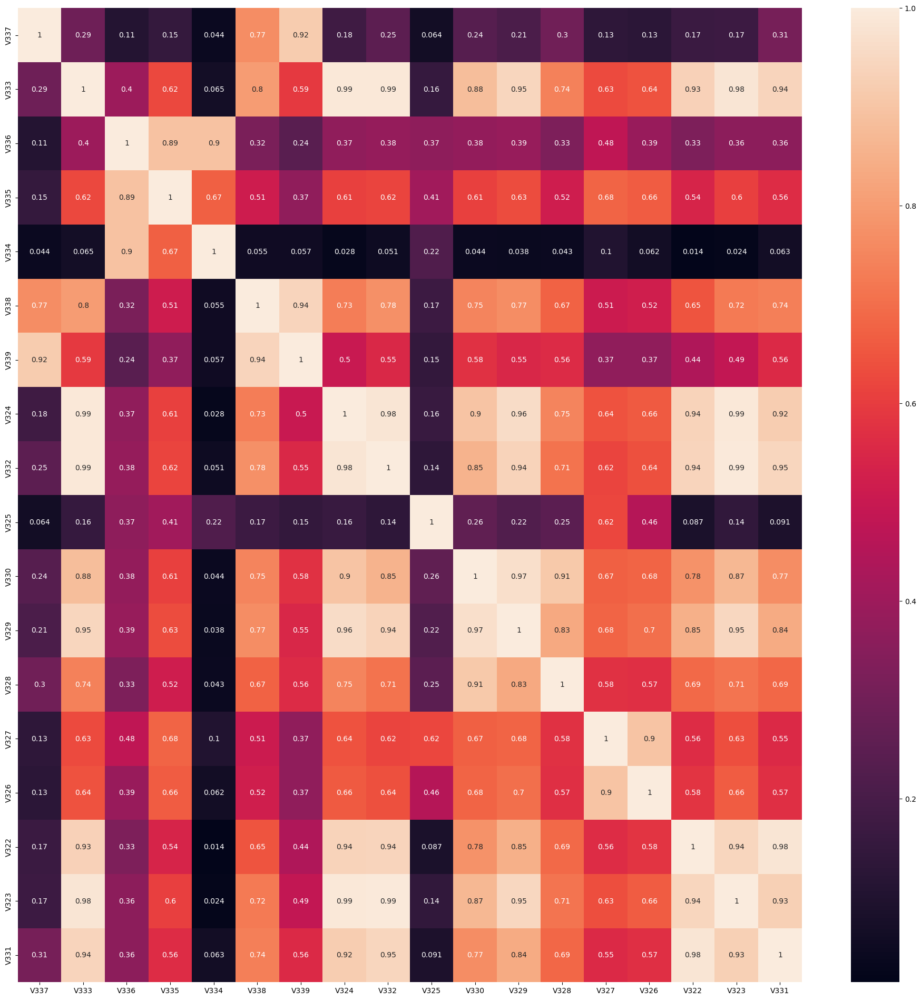

In [101]:
g15 = ['V337', 'V333', 'V336', 'V335', 'V334', 'V338', 'V339', 'V324', 'V332', 'V325', 'V330', 'V329', 'V328', 'V327', 'V326', 'V322', 'V323', 'V331']

corr = df[g15].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr, annot = True)

In [102]:
pairs = [['V322','V323','V324','V326','V327','V328','V329','V330','V331','V332','V333'],['V325'],['V334','V335','V336'],['V337','V338','V339']]

g15 = reduction(pairs)
g15

['V332', 'V325', 'V335', 'V338']

In [103]:
reduced_V_cols = ['V1', 'V3', 'V4', 'V6', 'V8', 'V11', 'V13', 'V14', 'V17', 'V20', 
 'V23', 'V26', 'V27', 'V30', 'V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48', 'V54', 'V56', 'V59', 
 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91', 'V96', 
 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127', 
 'V129', 'V130', 'V136', 'V138', 'V139', 'V142', 'V147', 'V156', 'V162', 'V165', 'V160', 'V166', 'V178',
 'V176', 'V173', 'V182', 'V187', 'V203', 'V205', 'V207', 'V215', 'V169', 'V171', 'V175', 'V180', 'V185', 
 'V188', 'V198', 'V210', 'V209', 'V218', 'V223', 'V224', 'V226', 'V228', 'V229', 'V235', 'V240', 'V258', 
 'V257', 'V253', 'V252', 'V260', 'V261', 'V264', 'V266', 'V267', 'V274', 'V277', 'V220', 'V221', 'V234', 
 'V238', 'V250', 'V271', 'V294', 'V284', 'V285', 'V286', 'V291',
 'V297', 'V303', 'V305', 'V307', 'V309', 'V310', 'V320', 'V281', 'V283', 'V289', 'V296', 'V301', 'V314', 'V332', 'V325', 'V335', 'V338']

In [104]:
drop_cols = [col for col in df.columns if col[0] == 'V' and col not in reduced_V_cols]
df.drop(drop_cols, axis=1, inplace=True)
print('Dropped ' + str(len(drop_cols)) + ' columns successfully')

Dropped 211 columns successfully


In [105]:
df[reduced_V_cols] = my_imputer.fit_transform(df[reduced_V_cols])

In [106]:
df[id_cols].head(10)

,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,43497.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,NaN,204.0,222.0,Found,Found,Windows 7,ie 11.0 for desktop,24.0,1920x1080,match_status:2,T,T,T,T
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,-5.0,49217.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,NotFound,52.0,-480.0,Found,Found,166.0,15.0,653.0,177.0,Found,Found,Windows 10,chrome 62.0,24.0,2736x1824,match_status:2,T,F,T,T
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


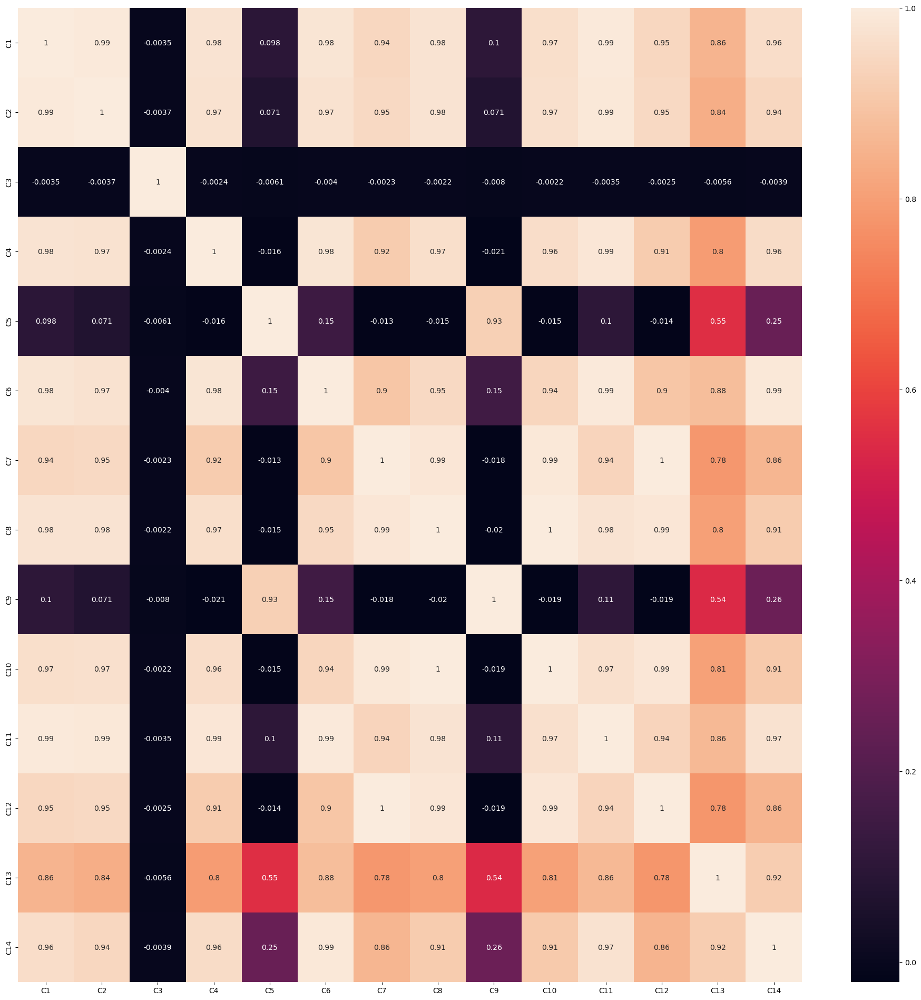

In [107]:
corr5 = df[c_cols].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr5, annot = True)

Except for C3 C5 C9 and C13, every other c column is highly correlated, so we drop them all.

In [108]:
del df['C1']
del df['C2']
del df['C4']
del df['C6']
del df['C7']
del df['C8']
del df['C10']
del df['C11']
del df['C12']
del df['C14']

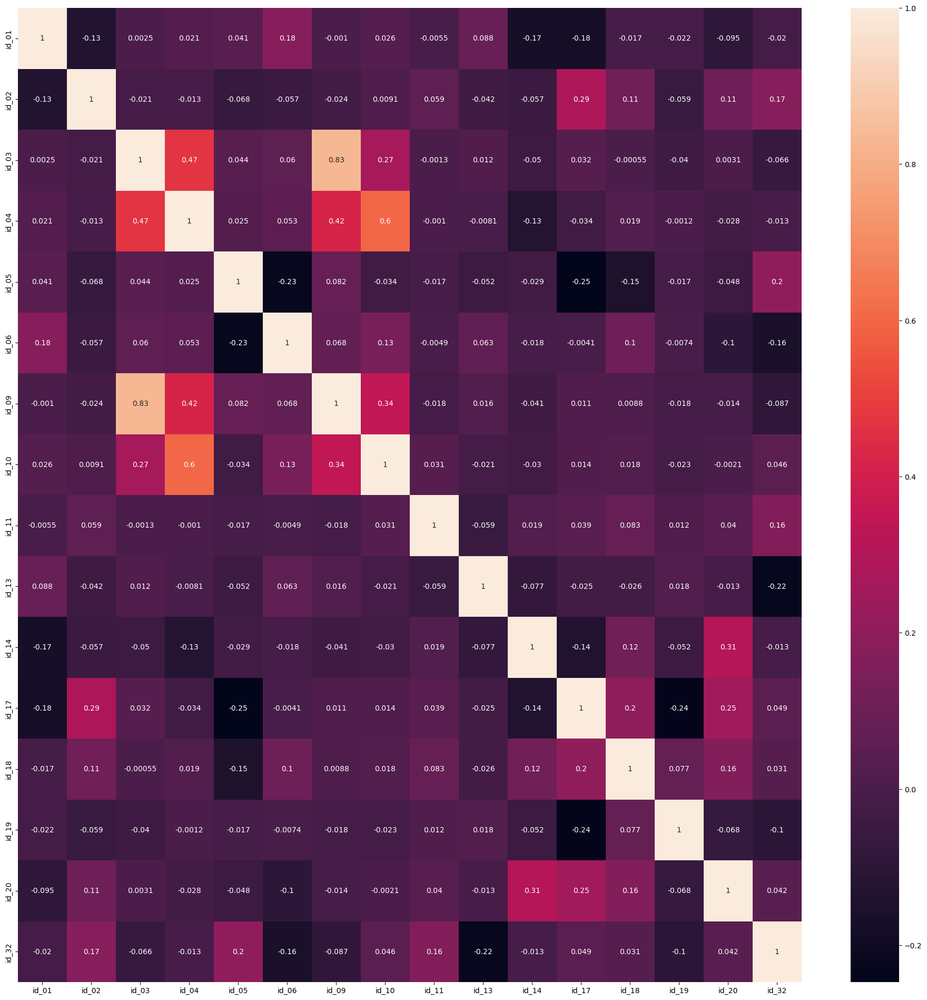

In [109]:
corr5 = df[id_cols].corr()
plt.figure(figsize = (24,24))
ax = sns.heatmap(corr5, annot = True)

In [110]:
df[id_cols].describe()

,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_32
count,212356.000000,208976.00000,117819.000000,117819.000000,203753.000000,203753.000000,130955.000000,130955.000000,209009.000000,193120.000000,92180.000000,206168.000000,67414.000000,206085.000000,205901.000000,89100.000000
mean,-12.903624,189071.11019,0.106859,-0.130717,1.549513,-7.328182,0.144897,-0.241671,99.758480,47.673483,-335.515405,197.358824,14.365844,342.118471,419.547190,26.959551
std,17.715325,167624.60209,1.004221,1.098510,5.270181,16.653478,1.184777,2.065315,1.070531,12.095740,103.075322,31.161632,1.481757,134.487073,147.056363,3.948959
min,-100.000000,1.00000,-13.000000,-13.000000,-72.000000,-100.000000,-36.000000,-100.000000,90.000000,11.000000,-660.000000,100.000000,11.000000,100.000000,100.000000,0.000000
25%,-15.000000,73249.75000,0.000000,0.000000,0.000000,-8.000000,0.000000,0.000000,100.000000,49.000000,-360.000000,166.000000,13.000000,266.000000,315.000000,24.000000
50%,-5.000000,137830.50000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.000000,52.000000,-300.000000,225.000000,15.000000,312.000000,500.000000,24.000000
75%,-5.000000,251148.00000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,100.000000,52.000000,-300.000000,225.000000,15.000000,427.000000,535.000000,32.000000
max,0.000000,999595.00000,10.000000,0.000000,52.000000,0.000000,25.000000,0.000000,100.000000,64.000000,720.000000,229.000000,29.000000,671.000000,661.000000,32.000000


In [111]:
df[id_cols].isna().sum()

id_01    406177
id_02    409557
id_03    500714
id_04    500714
id_05    414780
id_06    414780
id_09    487578
id_10    487578
id_11    409524
id_12    406177
id_13    425413
id_14    526353
id_15    409474
id_16    428118
id_17    412365
id_18    551119
id_19    412448
id_20    412632
id_28    409524
id_29    409524
id_30    529559
id_31    410559
id_32    529433
id_33    533330
id_34    528942
id_35    409474
id_36    409474
id_37    409474
id_38    409474
dtype: int64

In [112]:
num_id_cols = df[id_cols]._get_numeric_data().columns
cat_cols = list(set(id_cols) - set(num_id_cols))
cat_cols

['id_16',
 'id_38',
 'id_12',
 'id_30',
 'id_35',
 'id_31',
 'id_15',
 'id_34',
 'id_29',
 'id_37',
 'id_36',
 'id_28',
 'id_33']

In [113]:
df[num_id_cols] = my_imputer.fit_transform(df[num_id_cols])

In [114]:
df['id_33'].fillna(df['id_33'].mode()[0], inplace=True)
df['id_34'].fillna(df['id_34'].mode()[0], inplace=True)
df['id_30'].fillna(df['id_30'].mode()[0], inplace=True)
df['id_12'].fillna(df['id_12'].mode()[0], inplace=True)
df['id_31'].fillna(df['id_31'].mode()[0], inplace=True)
df['id_28'].fillna(df['id_28'].mode()[0], inplace=True)
df['id_38'].fillna(df['id_38'].mode()[0], inplace=True)
df['id_37'].fillna(df['id_37'].mode()[0], inplace=True)
df['id_35'].fillna(df['id_35'].mode()[0], inplace=True)
df['id_15'].fillna(df['id_15'].mode()[0], inplace=True)
df['id_16'].fillna(df['id_16'].mode()[0], inplace=True)
df['id_29'].fillna(df['id_29'].mode()[0], inplace=True)
df['id_36'].fillna(df['id_36'].mode()[0], inplace=True)

In [115]:
df['P_emaildomain'] = df['P_emaildomain'].fillna("Unknown")
df['R_emaildomain'] = df['R_emaildomain'].fillna("Unknown")
df['DeviceType'] = df['DeviceType'].fillna("Unknown")
df['DeviceInfo'] = df['DeviceInfo'].fillna("Unknown")

In [116]:
df.isna().sum()

TransactionID          0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2                  0
card3                  0
card4                  0
card5                  0
card6                  0
addr1                  0
addr2                  0
dist1                  0
dist2             555659
P_emaildomain          0
R_emaildomain          0
C3                     0
C5                     0
C9                     0
C13                    0
D1                     0
D3                     0
D4                     0
D5                     0
D7                534327
D8                     0
D9                     0
D10                    0
D11                    0
D13                    0
D14                    0
D15                    0
M1                     0
M2                     0
M3                     0
M4                     0
M5                     0
M6                     0
M7                     0
M8                     0


In [117]:
cols = df.columns
num_cols = df._get_numeric_data().columns
cat_cols = list(set(cols) - set(num_cols))
cat_cols

['id_38',
 'id_12',
 'id_36',
 'M1',
 'R_emaildomain',
 'M2',
 'M7',
 'DeviceInfo',
 'id_31',
 'P_emaildomain',
 'id_37',
 'card4',
 'id_28',
 'M4',
 'M9',
 'M6',
 'id_15',
 'id_34',
 'id_29',
 'id_33',
 'id_30',
 'M3',
 'M5',
 'id_16',
 'ProductCD',
 'card6',
 'id_35',
 'M8',
 'DeviceType']

In [118]:
for i in cat_cols:
    print( i+ ": " + str(df[i].nunique()))

id_38: 2
id_12: 2
id_36: 2
M1: 2
R_emaildomain: 61
M2: 2
M7: 2
DeviceInfo: 1655
id_31: 127
P_emaildomain: 60
id_37: 2
card4: 4
id_28: 2
M4: 3
M9: 2
M6: 2
id_15: 3
id_34: 4
id_29: 2
id_33: 230
id_30: 74
M3: 2
M5: 2
id_16: 2
ProductCD: 5
card6: 4
id_35: 2
M8: 2
DeviceType: 3


In [119]:
small_cat_cols = []
big_cat_cols = []
for i in cat_cols:
    if df[i].nunique()<7:
        small_cat_cols.append(i)
    else:
        big_cat_cols.append(i)
small_cat_cols

['id_38',
 'id_12',
 'id_36',
 'M1',
 'M2',
 'M7',
 'id_37',
 'card4',
 'id_28',
 'M4',
 'M9',
 'M6',
 'id_15',
 'id_34',
 'id_29',
 'M3',
 'M5',
 'id_16',
 'ProductCD',
 'card6',
 'id_35',
 'M8',
 'DeviceType']

In [120]:
df= pd.get_dummies(data=df, columns = small_cat_cols )
df.shape

(618533, 235)

In [121]:
for i in big_cat_cols:
    df[i] = df[i].astype('category')

for i in big_cat_cols:
    df[i] = df[i].cat.codes

df.shape

(618533, 235)

In [122]:
df.head(10)

,TransactionID,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C3,C5,C9,C13,D1,D3,D4,D5,D7,D8,D9,D10,D11,D13,D14,D15,V1,V3,V4,V6,V8,V11,V13,V14,V17,V20,V23,V26,V27,V30,V36,V37,V40,V41,V44,V47,V48,V54,V56,V59,V62,V65,V67,V68,V70,V76,V78,V80,V82,V86,V88,V89,V91,V96,V98,V99,V104,V107,V108,V111,V115,V117,V120,V121,V123,V124,V127,V129,V130,V136,V138,V139,V142,V147,V156,V160,V162,V165,V166,V169,V171,V173,V175,V176,V178,V180,V182,V185,V187,V188,V198,V203,V205,V207,V209,V210,V215,V218,V220,V221,V223,V224,V226,V228,V229,V234,V235,V238,V240,V250,V252,V253,V257,V258,V260,V261,V264,V266,V267,V271,V274,V277,V281,V283,V284,V285,V286,V289,V291,V294,V296,V297,V301,V303,V305,V307,V309,V310,V314,V320,V325,V332,V335,V338,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_30,id_31,id_32,id_33,DeviceInfo,id_38_F,id_38_T,id_12_Found,id_12_NotFound,id_36_F,id_36_T,M1_F,M1_T,M2_F,M2_T,M7_F,M7_T,id_37_F,id_37_T,card4_american express,card4_discover,card4_mastercard,card4_visa,id_28_Found,id_28_New,M4_M0,M4_M1,M4_M2,M9_F,M9_T,M6_F,M6_T,id_15_Found,id_15_New,id_15_Unknown,id_34_match_status:-1,id_34_match_status:0,id_34_match_status:1,id_34_match_status:2,id_29_Found,id_29_NotFound,M3_F,M3_T,M5_F,M5_T,id_16_Found,id_16_NotFound,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,card6_charge card,card6_credit,card6_debit,card6_debit or credit,id_35_F,id_35_T,M8_F,M8_T,DeviceType_Unknown,DeviceType_desktop,DeviceType_mobile
0,3210335,5263531,49.000,8785.0,555.0,150.0,226.0,436.000000,87.000000,2.00000,NaN,54,0,0.0,0.0,1.0,1.0,0.0,23.697641,532.000000,433.000000,NaN,87.919563,0.533102,0.000000,0.000000,10.897689,53.498133,0.000000,1.000000,1.000000,1.00000,1.00000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.074971,1.419217,0.093817,0.485004,1.089214,32038.334426,13.345943,1502.722122,293.623084,0.281161,2.655188,0.046491,0.211269,1.921957,4.636255,0.825051,0.757192,0.312924,2.258971,1.382655,1.088999,755.578972,13.828573,52.224943,27.260888,14.64657,124.595149,2.995274,0.315456,1.925659,0.096042,0.403046,0.264513,2.046999,2.75252,1.695262,0.312422,0.253067,1.001076,0.833437,1.144569,1.292576,2.155826,2.441824,1.053811,1.369743,246.989981,7.387705,28.534127,12.84098,146.708115,67.666314,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.0,0.0,0.0,0.000000,0.061379,919.15648,55.289657,114.867529,-12.903624,189071.11019,0.106859,-0.130717,1.549513,-7.328182,0.144897,-0.241671,99.75848,47.673483,-335.515405,197.358824,14.365844,342.118471,419.54719,42,46,26.959551,117,1438,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,1,0,1,0,0,0,0,0,1,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1,0,0
1,3100075,2211200,75.000,9112.0,250.0,150.0,226.0,441.000000,87.000000,129.53955,NaN,3,3,0.0,0.0,0.0,1.0,0.0,23.697641,117.345183,32.331659,NaN,186.583328,0.583333,102.156298,133.938172,10.897689,53.498133,137.077544,0.999961,1.101723,0.85355,1.04911,1.031691,0.421039,0.558787,0.999561,0.245892,0.878899,1.098118,0.993905,0.000542,0.311542,0.516427,1.323238,0.360473,0.999457,1.372767,1.107431,0.284209,0.587426,1.19068,0.229913,0.927427,0.999767,1.031542,0.000385,0.31517,0.546245,1.343615,0.268642,0.881772,1.246735,0.999217,0.000625,0.321752,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.00000,0.000000,0.000000,0.000000,1.000

In [123]:
cols = df.columns
num_cols = df._get_numeric_data().columns
cat_cols = list(set(cols) - set(num_cols))
cat_cols

[]

In [124]:
columns_to_drop = ['TransactionID', 'dist2', 'D7']
df_dropped = df.drop(columns=columns_to_drop)

In [125]:
train_df = df_dropped.iloc[:470898,:]

In [126]:
train_df.shape

(470898, 232)

In [127]:
test_df = df_dropped.iloc[470898:,:]

In [128]:
test_df.shape

(147635, 232)

In [129]:
XGBmodel = xgb.XGBClassifier()
XGBmodel.fit(train_df, y_train)
 
y_pred = XGBmodel.predict(test_df)

In [130]:
y_pred

array([0, 1, 0, ..., 0, 0, 0])

In [132]:
y_test = pd.read_csv('mock_submission.csv')


In [133]:
y_test = np.array(y_test)

In [134]:
y_test = y_test.reshape(-1)

In [135]:
y_test

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [136]:
accuracy_xgboost = accuracy_score(y_pred, y_test)

In [137]:
accuracy_xgboost

0.9085514952416432